# COPDGene Multiomics Summary

In [1]:
import pandas as pd

import pathlib

import plotly.express as px
import pandas as pd
from IPython.display import Image, display

import os
import json

import matplotlib.pyplot as plt

from itertools import combinations
import math
import pydot
from IPython.display import Image, display


In [2]:
FREEZE_DIR = pathlib.Path('/proj/regeps/regep00/studies/TopMed/data/dna/whole_genome/TopMed/data/freezes/freeze.10.cdnm')
MULTIOMICS_MANIFEST_EXTRACTED = FREEZE_DIR/'multiomics/GECOPD/ANNOTATED_MANIFEST.csv'
MULTIOMICS_CDATA_EXTRACTED = FREEZE_DIR/'multiomics/GECOPD/c_data.build_sample_groups'
MULTIOMICS_MANIFEST_PLATE103 = FREEZE_DIR/'multiomics/GECOPD.1/ANNOTATED_MANIFEST.csv'
CONFIG_JSON = FREEZE_DIR/'conf/config.json'


# Raw Input Datasets for Multiomics

## Manifests
* wgs
* unified
* methylation
* rna
* rnaseq

In [3]:
with open(CONFIG_JSON) as fh:
    config = json.load(fh)

datasets = pd.DataFrame(config['GECOPD']['datasets'])
datasets

,id,name,manifest_path,load_into_spot,spot_path,sample_type_code,gender_observations,gender_observations_sample_column,gender_observations_column,gender_observations_delim_whitespace,manifest_type,alias_column,resultid_lookup,sample_label_column,delimiter
0,0,wgs,tmp/GECOPD_annotated_plink_merged.fam,True,/proj/regeps/regep00/studies/TopMed/data/dna/w...,d,tmp/GECOPD_annotated_plink_merged.sexcheck,IID,SNPSEX,True,NaN,NaN,NaN,NaN,NaN
1,1,ref,/proj/regeps/regep00/studies/COPDGene/data/gen...,False,NaN,d,/proj/regeps/regep00/studies/COPDGene/analyses...,IID,SNPSEX,True,NaN,NaN,NaN,NaN,NaN
2,2,methylation,/proj/regeps/regep00/studies/GECOPD/data/methy...,True,/proj/regeps/regep00/studies/GECOPD/data/methy...,m,/udd/resiq/meffil/QC/COPD.blood/COPD.sex.summa...,sample.name,predicted.sex,False,NaN,NaN,NaN,NaN,NaN
3,3,rna,/proj/regeps/regep00/studies/COPDGene/data/rna...,True,/proj/regeps/regep00/studies/COPDGene/data/rna...,r,/proj/regeps/regep00/studies/COPDGene/data/rna...,Sample,expsex,True,topmed_rna,TORID,/proj/regeps/regep00/studies/COPDGene/data/rna...,NaN,NaN
4,4,rnaseq,tmp/GECOPD_all_rna_manifest.txt,True,,r,metadata/gecopd_rna_fake_gender.csv,SampleLabel,ObservedGender,False,custom,NaN,NaN,SampleLabel,","


## Raw/Pre-Filtered Concordance Data


In [5]:

concordance_sources = pd.DataFrame(config['GECOPD']['concordance_observations'])
concordance_sources

,path,type,cutoff,query_dataset,reference_dataset,concord_column_label,best_sample_column_label,best_match_column_label,next_sample_column_label,next_match_column_label,sample_label_column
0,tmp/GECOPD_reference_concordance.con,raw,0.354,0,1,Concord,NaN,NaN,NaN,NaN,NaN
1,tmp/GECOPD_methylation_freeze10.kin0,raw,0.800,2,0,Kinship,NaN,NaN,NaN,NaN,NaN
2,/proj/regeps/regep00/studies/GECOPD/data/methy...,summarized,80.000,2,2,NaN,Best_Match,Best_Pct,Next_Best,Next_Pct,NaN
3,tmp/GECOPD_reference_concordance.con,raw,0.354,1,1,Concord,NaN,NaN,NaN,NaN,NaN
4,tmp/GECOPD_rna_wgs_king_results.csv,kinship-matrix,0.150,4,0,Kinship,IID_orig_y,Kinship,NaN,NaN,IID_orig_x
5,tmp/GECOPD_rna_rna_collated_king_results.csv,kinship-matrix,0.354,4,0,Kinship,IID_orig_y,Kinship,NaN,NaN,IID_orig_x
6,/proj/regeps/regep00/studies/COPDGene//analyse...,summarized,0.354,3,1,KC,Best Match,KC,NaN,NaN,Sample
7,/proj/regeps/regep00/studies/COPDGene/analyses...,summarized,0.354,3,1,KC,Best Match,KC,Next Best,KC_Next,Sample


# Output From Multiomics


## Annotated Manifest

In [4]:
annotated_manifest = pd.read_csv(MULTIOMICS_MANIFEST_EXTRACTED)
annotated_manifest

/udd/rejpz/.conda/envs/cdnm-jupyter-python-3.7.6/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (3,10,11,12,13,14,15,16,18,19,20,24,25,26,30,31,33,34,37,38,39,42,46,51,53,57,58,59,60,61,62,63,64,71,72,74,77,78,79,80,81,82,84) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,Unnamed: 0,Unnamed: 0.1,SampleLabel,S_SAMPLEID_manifest,SampleAlias,SampleTypeCode,dataset_id,is_reference,S_SUBJECTID,S_SAMPLEID,...,u_collectiontypid,u_legacyfamilyid,u_packageid,ExpectedGender,ObservedGender,flags,group_id,c_group,keep_drop,status
0,0,0,NWD100018,NaN,NWD100018,d,0,0,ST-01000557,S-001174464,...,NaN,NaN,NaN,M,M,NaN,7233,23038,NaN,NaN
1,1,1,NWD100059,NaN,NWD100059,d,0,0,ST-00033813,S-000554104,...,NaN,NaN,NaN,M,F,gender_mismatch,1144,1,NaN,NaN
2,2,2,NWD100095,NaN,NWD100095,d,0,0,ST-00075744,S-000964706,...,NaN,NaN,NaN,F,F,NaN,3426,2,NaN,NaN
3,3,3,NWD100109,NaN,NWD100109,d,0,0,ST-00078957,S-001558939,...,NaN,NaN,NaN,F,F,NaN,6607,33441,NaN,NaN
4,4,4,NWD100230,NaN,NWD100230,d,0,0,ST-00077474,S-001557255,...,NaN,NaN,NaN,F,F,NaN,5135,33035,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37614,37614,37614,S-001644042_accepted_hits.sorted.bam,S-001644042,S-001644042_accepted_hits.sorted.bam,r,4,0,ST-01024867,S-001644042,...,CT-GECOPD-0014,NaN,NaN,M,NaN,observed_gender_missing,10672,22299,NaN,NaN
37615,37615,37615,S-001644043_accepted_hits.sorted.bam,S-001644043,S-001644043_accepted_hits.sorted.bam,r,4,0,ST-01024865,S-001644043,...,CT-GECOPD-0014,NaN,NaN,M,NaN,observed_gender_missing,10670,26429,NaN,NaN
37616,37616,37616,S-001644044_accepted_hits.sorted.bam,S-001644044,S-001644044_accepted_hits.sorted.bam,r,4,0,ST-01024872,S-001644044,...,CT-GECOPD-0014,NaN,NaN,M,NaN,observed_gender_missing,10675,23371,NaN,NaN
37617,37617,37617,S-001648029_CGGCGTGA-GCGCCTGT_L003_accepted_hi...,S-001648029,S-001648029_CGGCGTGA-GCGCCTGT_L003_accepted_hi...,r,4,0,ST-01002733,S-001648029,...,CT-GECOPD-0014,NaN,NaN,F,F,NaN,8080,27636,NaN,NaN


## Concordance Observation Matrix

In [7]:
c_data = pd.read_csv(MULTIOMICS_CDATA_EXTRACTED)

In [8]:
c_data

,Unnamed: 0,ID1,ID2,attempted,expected,observed,Concord
0,0,NWD213653,10009Y,1,1,1,1.00000
1,1,10009Y,NWD213653,1,1,1,1.00000
2,2,NWD549799,10010J,1,1,1,0.99985
3,3,NWD549799,TOE187020_203833040079_R01C01_358713,1,1,1,1.00000
4,4,NWD549799,TOE199514_203824910072_R08C01_358712,1,1,1,1.00000
...,...,...,...,...,...,...,...
158031,158031,TOE590046_203991530017_R06C01_376151,S-001613494_accepted_hits.sorted.bam,0,1,0,NaN
158032,158032,S-001613494_accepted_hits.sorted.bam,NWD993624,1,0,1,0.24040
158033,158033,S-001613494_accepted_hits.sorted.bam,17694W,0,1,0,NaN
158034,158034,S-001613494_accepted_hits.sorted.bam,TOE137422_203991530017_R05C01_376150,0,1,0,NaN


In [9]:
dataset_size = annotated_manifest.groupby(['dataset_id']).size()
dataset_size

dataset_id
0    10753
1    10062
2    12433
3      386
4     3985
dtype: int64

## Sample Status by Dataset Id

This table gives a rough idea of how much work each omics may require via brute force

Tracking here 

https://docs.google.com/spreadsheets/d/1I0Db_v_3OToW-qH5ZK6gLXUwCurE3Juy9ImCFy7XBIE/edit#gid=1980276213


In [10]:
dataset_by_status = annotated_manifest.groupby(['dataset_id', 'status']).size()
dataset_by_status

dataset_id  status                      
0           pass                             9043
            pass_isolate                       56
            review-unknown                    406
            review_cross_subject_matches      524
            review_gender_mismatch             42
            review_unmatched_sample           682
1           pass                             8836
            pass_isolate                       41
            review-unknown                     90
            review_cross_subject_matches      424
            review_gender_mismatch             31
            review_unmatched_sample           640
2           pass                            10157
            review-unknown                    408
            review_cross_subject_matches      635
            review_gender_mismatch             33
            review_unmatched_sample          1200
3           pass                              309
            review-unknown                     12
         

## Samples are grouped by S_SUBJECTID

There are 38356 samples belonging to 10712 S_SUBJECTIDs

In [7]:
annotated_manifest.groupby(['S_SUBJECTID']).agg(len).reset_index()

,S_SUBJECTID,Unnamed: 0,Unnamed: 0.1,SampleLabel,S_SAMPLEID_manifest,SampleAlias,SampleTypeCode,dataset_id,is_reference,S_SAMPLEID,...,u_collectiontypid,u_legacyfamilyid,u_packageid,ExpectedGender,ObservedGender,flags,group_id,c_group,keep_drop,status
0,NWD162119,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
1,NWD176102,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
2,NWD180924,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
3,NWD188550,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
4,NWD195503,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10729,ST-01025657,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
10730,ST-01025778,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3
10731,ST-01025779,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3
10732,ST-01025780,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2


## Also grouped by concordance observations

In [12]:
concordance_observations = pd.DataFrame(config['GECOPD']['concordance_observations'])
concordance_observations

,path,type,cutoff,query_dataset,reference_dataset,concord_column_label,best_sample_column_label,best_match_column_label,next_sample_column_label,next_match_column_label,sample_label_column
0,tmp/GECOPD_reference_concordance.con,raw,0.354,0,1,Concord,NaN,NaN,NaN,NaN,NaN
1,tmp/GECOPD_methylation_freeze10.kin0,raw,0.800,2,0,Kinship,NaN,NaN,NaN,NaN,NaN
2,/proj/regeps/regep00/studies/GECOPD/data/methy...,summarized,80.000,2,2,NaN,Best_Match,Best_Pct,Next_Best,Next_Pct,NaN
3,tmp/GECOPD_reference_concordance.con,raw,0.354,1,1,Concord,NaN,NaN,NaN,NaN,NaN
4,tmp/GECOPD_rna_wgs_king_results.csv,kinship-matrix,0.150,4,0,Kinship,IID_orig_y,Kinship,NaN,NaN,IID_orig_x
5,tmp/GECOPD_rna_rna_collated_king_results.csv,kinship-matrix,0.354,4,0,Kinship,IID_orig_y,Kinship,NaN,NaN,IID_orig_x
6,/proj/regeps/regep00/studies/COPDGene//analyse...,summarized,0.354,3,1,KC,Best Match,KC,NaN,NaN,Sample
7,/proj/regeps/regep00/studies/COPDGene/analyses...,summarized,0.354,3,1,KC,Best Match,KC,Next Best,KC_Next,Sample


In [13]:
annotated_manifest.groupby(['group_id']).size()

group_id
4          2
5          6
6          3
7          4
8          2
          ..
1000023    3
1000024    2
1000025    5
1000026    2
1000027    5
Length: 10434, dtype: int64

In [14]:
sample_groups = pd.read_csv(FREEZE_DIR/'tmp/GECOPD/sample_groups.flag_sample_groups')         
sample_groups

,Unnamed: 0,pass_fail_type
0,4,pass
1,5,pass
2,6,pass
3,7,pass
4,8,pass
...,...,...
10429,1000023,review_cross_subject_matches
10430,1000024,review_cross_subject_matches
10431,1000025,review_cross_subject_matches
10432,1000026,review_cross_subject_matches


In [15]:
sample_groups.groupby('pass_fail_type').size()

pass_fail_type
pass                            9005
pass_isolate                      98
review-unknown                   409
review_cross_subject_matches     193
review_gender_mismatch            51
review_unmatched_sample          678
dtype: int64

# Clusters

## Introduction

Each group, annotated with T=\<total number of samples in the group\>

In [16]:
samples_by_group_id = annotated_manifest.groupby('group_id').size().reset_index()
samples_by_group_id = samples_by_group_id.rename({0: 'T'}, axis=1)
samples_by_group_id 

,group_id,T
0,4,2
1,5,6
2,6,3
3,7,4
4,8,2
...,...,...
10429,1000023,3
10430,1000024,2
10431,1000025,5
10432,1000026,2


In [17]:
subjects_by_group_id = annotated_manifest.groupby('group_id')['S_SUBJECTID'].unique().reset_index()
subjects_by_group_id

,group_id,S_SUBJECTID
0,4,[ST-00007399]
1,5,[ST-00007400]
2,6,[ST-00007401]
3,7,[ST-00007402]
4,8,[ST-00007403]
...,...,...
10429,1000023,"[nan, ST-01007222]"
10430,1000024,"[nan, ST-00074136]"
10431,1000025,"[nan, ST-00007470]"
10432,1000026,"[nan, ST-00074662]"


In [18]:
status_by_group_id = annotated_manifest.groupby('group_id')['status'].agg(lambda x: ','.join(x.unique()))
status_by_group_id

group_id
4                                  pass
5                                  pass
6                                  pass
7                                  pass
8                                  pass
                       ...             
1000023    review_cross_subject_matches
1000024    review_cross_subject_matches
1000025    review_cross_subject_matches
1000026    review_cross_subject_matches
1000027    review_cross_subject_matches
Name: status, Length: 10434, dtype: object

In [19]:
groups_with_metadata = subjects_by_group_id.merge(status_by_group_id, on='group_id')
groups_with_metadata = groups_with_metadata.merge(samples_by_group_id, on='group_id')
groups_with_metadata['N'] = groups_with_metadata['S_SUBJECTID'].str.len()
groups_with_metadata

,group_id,S_SUBJECTID,status,T,N
0,4,[ST-00007399],pass,2,1
1,5,[ST-00007400],pass,6,1
2,6,[ST-00007401],pass,3,1
3,7,[ST-00007402],pass,4,1
4,8,[ST-00007403],pass,2,1
...,...,...,...,...,...
10429,1000023,"[nan, ST-01007222]",review_cross_subject_matches,3,2
10430,1000024,"[nan, ST-00074136]",review_cross_subject_matches,2,2
10431,1000025,"[nan, ST-00007470]",review_cross_subject_matches,5,2
10432,1000026,"[nan, ST-00074662]",review_cross_subject_matches,2,2


## Histogram of N

### Remove "batch_level_errors" from the plot

In [158]:
groups_with_metadata['N'].value_counts().to_frame().sort_index()

,N
1,10241
2,170
3,9
4,5
5,1
6,2
8,1
9,1
11,2
16,1


## groups with just one subject

In [137]:
single_subject = groups_with_metadata[groups_with_metadata.N == 1].reset_index()
single_subject

,index,group_id,S_SUBJECTID,status,T,N
0,0,4,[ST-00007399],pass,2,1
1,1,5,[ST-00007400],pass,6,1
2,2,6,[ST-00007401],pass,3,1
3,3,7,[ST-00007402],pass,4,1
4,4,8,[ST-00007403],pass,2,1
...,...,...,...,...,...,...
10236,10403,10702,[ST-01025657],review-unknown,2,1
10237,10404,10703,[ST-01025778],review_unmatched_sample,3,1
10238,10405,10704,[ST-01025779],review_unmatched_sample,3,1
10239,10406,10705,[ST-01025780],review-unknown,2,1


### sub-group: pass!

In [20]:
passing = single_subject[single_subject.status == 'pass']
passing

,index,group_id,S_SUBJECTID,status,T,N
0,0,4,[ST-00007399],pass,2,1
1,1,5,[ST-00007400],pass,6,1
2,2,6,[ST-00007401],pass,3,1
3,3,7,[ST-00007402],pass,4,1
4,4,8,[ST-00007403],pass,2,1
...,...,...,...,...,...,...
10135,10293,10592,[ST-01024022],pass,2,1
10136,10294,10593,[ST-01024023],pass,3,1
10155,10313,10612,[ST-01024131],pass,4,1
10162,10327,10626,[ST-01024281],pass,4,1


/udd/rejpz/.conda/envs/cdnm-jupyter-python-3.7.6/lib/python3.9/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


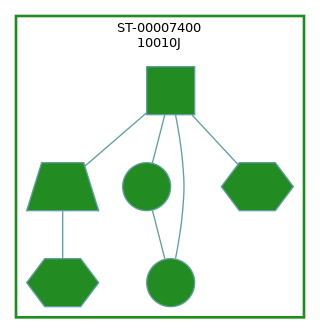

In [72]:
GROUP_ID = 5
# display(Image(graph_generator.graph(group_id, shape_by='dataset_id')))
display(Image(graph_thumbnail_generator.graph(GROUP_ID, shape_by='dataset_id')))

----

### isolates

Groups with just one sample

In [73]:
isolates = single_subject[single_subject['T'] == 1].reset_index()
isolates

,level_0,index,group_id,S_SUBJECTID,status,T,N
0,694,710,730,[ST-00008126],pass_isolate,1,1
1,720,736,757,[ST-00008153],pass_isolate,1,1
2,905,924,956,[ST-00030855],pass_isolate,1,1
3,991,1016,1054,[ST-00032748],pass_isolate,1,1
4,995,1020,1058,[ST-00032772],pass_isolate,1,1
...,...,...,...,...,...,...,...
119,10158,10317,10616,[ST-01024252],review_gender_mismatch,1,1
120,10159,10318,10617,[ST-01024264],review_gender_mismatch,1,1
121,10160,10320,10619,[ST-01024268],review_gender_mismatch,1,1
122,10166,10331,10630,[ST-01024336],review_gender_mismatch,1,1


In [74]:
isolate_samples = annotated_manifest[annotated_manifest['group_id'].isin(isolates['group_id'])]
isolate_samples.groupby(['flags', 'status'], dropna=False).size()

flags                                          status                
gender_mismatch                                review_gender_mismatch     9
gender_mismatch;observed_gender_indeterminate  review_gender_mismatch     8
observed_gender_missing                        review-unknown             9
NaN                                            pass_isolate              98
dtype: int64

### non-isolates

In [75]:
### For these subjects, it will probably suffice to draw a collection of 
### a simple representation of the sample group
remain = single_subject[(single_subject['T'] > 1) & (single_subject.status != 'pass')].reset_index()
remain

,level_0,index,group_id,S_SUBJECTID,status,T,N
0,15,15,19,[ST-00007414],review_unmatched_sample,5,1
1,17,17,21,[ST-00007416],review_unmatched_sample,5,1
2,30,30,35,[ST-00007430],review_unmatched_sample,5,1
3,36,36,42,[ST-00007437],review_unmatched_sample,5,1
4,42,42,48,[ST-00007443],review_unmatched_sample,5,1
...,...,...,...,...,...,...,...
1107,10236,10403,10702,[ST-01025657],review-unknown,2,1
1108,10237,10404,10703,[ST-01025778],review_unmatched_sample,3,1
1109,10238,10405,10704,[ST-01025779],review_unmatched_sample,3,1
1110,10239,10406,10705,[ST-01025780],review-unknown,2,1


In [345]:
### There are only two options
### 1) Gender problems
### 2) Unmatched samples (i.e. multiple concordance groups)
#### a) can be explained by unobserved concordance data
#### b) cannot be explained by unobserved concordance data (these should be review_unmatched_sample)

/udd/rejpz/.conda/envs/cdnm-jupyter-python-3.7.6/lib/python3.9/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


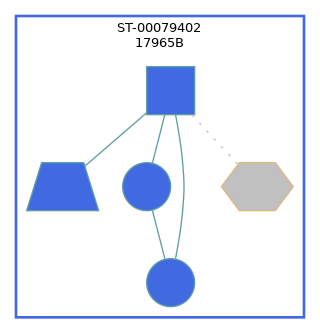

/d/tmp/rejpz/ipykernel_8373/1311097262.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)
/udd/rejpz/.conda/envs/cdnm-jupyter-python-3.7.6/lib/python3.9/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


Extracted 1 subjects for group_id=7021: ['ST-00079402']
['NWD719662', '17965B', 'TOE808608_203714600020_R08C01_349787', 'TOE293514_203714600021_R07C01_349824', 'S-001565849_GAGATTCC-TATAGCCT_L008_accepted_hits.sorted.bam']


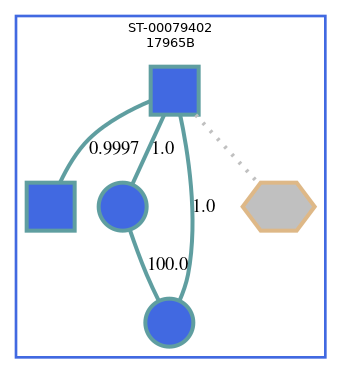

In [83]:
GROUP_ID = remain.sample()['group_id'].values[0]
# display(Image(graph_generator.graph(group_id, shape_by='dataset_id')))
display(Image(graph_thumbnail_generator.graph(GROUP_ID, shape_by='dataset_id')))
display(Image(graph_generator.graph(GROUP_ID, shape_by='dataset_id')))

----

## subject-pairs

In [86]:
subject_pairs = groups_with_metadata[groups_with_metadata.N == 2].reset_index()
subject_pairs

,index,group_id,S_SUBJECTID,status,T,N
0,48,54,"[ST-00007449, ST-00008251]",review_cross_subject_matches,7,2
1,73,80,"[ST-00007475, ST-00007999]",review_cross_subject_matches,7,2
2,207,217,"[ST-00078703, ST-00007613]",review_cross_subject_matches,8,2
3,233,243,"[ST-00007639, ST-00038488]",review_cross_subject_matches,6,2
4,288,299,"[ST-00007695, ST-00076454]",review_cross_subject_matches,9,2
...,...,...,...,...,...,...
165,10429,1000023,"[nan, ST-01007222]",review_cross_subject_matches,3,2
166,10430,1000024,"[nan, ST-00074136]",review_cross_subject_matches,2,2
167,10431,1000025,"[nan, ST-00007470]",review_cross_subject_matches,5,2
168,10432,1000026,"[nan, ST-00074662]",review_cross_subject_matches,2,2


### pairs-with-na-subject

The following pairs appear to have "rescued" one or more samples that were not previously assigned to a subject

In [87]:
groups_with_na_subjects = annotated_manifest[annotated_manifest['S_SUBJECTID'].isna()]['group_id']
an_unknown_subject = subject_pairs[subject_pairs.group_id.isin(groups_with_na_subjects)].reset_index()
an_unknown_subject

,level_0,index,group_id,S_SUBJECTID,status,T,N
0,144,10408,1000001,"[nan, ST-00078224]",review_cross_subject_matches,4,2
1,145,10409,1000002,"[nan, ST-01006783]",review_cross_subject_matches,5,2
2,146,10410,1000003,"[nan, ST-00007520]",review_cross_subject_matches,2,2
3,147,10411,1000004,"[nan, ST-00007944]",review_cross_subject_matches,2,2
4,148,10412,1000005,"[nan, ST-00075174]",review_cross_subject_matches,3,2
5,149,10413,1000006,"[nan, ST-00078678]",review_cross_subject_matches,5,2
6,150,10414,1000007,"[nan, ST-01003061]",review_cross_subject_matches,2,2
7,151,10415,1000008,"[nan, ST-00074738]",review_cross_subject_matches,2,2
8,152,10416,1000009,"[nan, ST-00075033]",review_cross_subject_matches,3,2
9,153,10417,1000010,"[nan, ST-01002660]",review_cross_subject_matches,5,2


/d/tmp/rejpz/ipykernel_8373/1311097262.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)
/udd/rejpz/.conda/envs/cdnm-jupyter-python-3.7.6/lib/python3.9/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


Extracted 2 subjects for group_id=1000004: ['ST-00007944', 'NWD188550']
['NWD188550', '12395N']


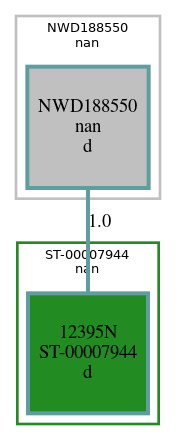

In [109]:
group_id = an_unknown_subject.sample()['group_id'].values[0]
display(Image(graph_generator.graph(group_id, shape_by='dataset_id')))

### pairs-with-both-known

In [113]:
groups_with_na_subjects = annotated_manifest[annotated_manifest['S_SUBJECTID'].isna()]['group_id']
subject_pairs_both_known = subject_pairs[~subject_pairs.group_id.isin(groups_with_na_subjects)].reset_index()
subject_pairs_both_known

,level_0,index,group_id,S_SUBJECTID,status,T,N
0,0,48,54,"[ST-00007449, ST-00008251]",review_cross_subject_matches,7,2
1,1,73,80,"[ST-00007475, ST-00007999]",review_cross_subject_matches,7,2
2,2,207,217,"[ST-00078703, ST-00007613]",review_cross_subject_matches,8,2
3,3,233,243,"[ST-00007639, ST-00038488]",review_cross_subject_matches,6,2
4,4,288,299,"[ST-00007695, ST-00076454]",review_cross_subject_matches,9,2
...,...,...,...,...,...,...,...
139,139,10323,10622,"[ST-00035217, ST-01024275]",review_cross_subject_matches,5,2
140,140,10324,10623,"[ST-00038049, ST-01024276]",review_cross_subject_matches,7,2
141,141,10325,10624,"[ST-01001881, ST-01024277]",review_cross_subject_matches,6,2
142,142,10332,10631,"[ST-00037635, ST-01024448]",review_cross_subject_matches,6,2


In [114]:
for (pair_idx, paired_group) in subject_pairs_both_known.iterrows():
    ## get all concordance data between the two subjects
    subjects = sorted(list(paired_group['S_SUBJECTID']))
    samples0 = sorted(list(annotated_manifest[annotated_manifest['S_SUBJECTID'] == subjects[0]]['SampleLabel']))
    samples1 = sorted(list(annotated_manifest[annotated_manifest['S_SUBJECTID'] == subjects[1]]['SampleLabel']))
    concordances = c_data[(c_data['ID1'].isin(samples0)) & (c_data['ID2'].isin(samples1)) & (c_data['observed'] == 1)]
    left_cross_count = len(set(concordances['ID1']))
    right_cross_count = len(set(concordances['ID2']))
    #print(f'{pair_idx}: s0={samples0}\ns1={samples1}\nc_data={concordances}\nl={left_count},r={right_count}')
    subject_pairs_both_known.loc[pair_idx, 'left_subject'] = subjects[0]
    subject_pairs_both_known.loc[pair_idx, 'right_subject'] = subjects[1]
    subject_pairs_both_known.loc[pair_idx, 'left_cross_count'] = left_cross_count
    subject_pairs_both_known.loc[pair_idx, 'right_cross_count'] = right_cross_count
    subject_pairs_both_known.loc[pair_idx, 'left_total_count'] = len(samples0)
    subject_pairs_both_known.loc[pair_idx, 'right_total_count'] = len(samples1)
subject_pairs_both_known.to_csv(FREEZE_DIR/'tmp/GECOPD/subject_pairs_both_known.csv')
subject_pairs_both_known

,level_0,index,group_id,S_SUBJECTID,status,T,N,left_subject,right_subject,left_cross_count,right_cross_count,left_total_count,right_total_count
0,0,48,54,"[ST-00007449, ST-00008251]",review_cross_subject_matches,7,2,ST-00007449,ST-00008251,3.0,1.0,4.0,3.0
1,1,73,80,"[ST-00007475, ST-00007999]",review_cross_subject_matches,7,2,ST-00007475,ST-00007999,1.0,1.0,5.0,2.0
2,2,207,217,"[ST-00078703, ST-00007613]",review_cross_subject_matches,8,2,ST-00007613,ST-00078703,3.0,3.0,4.0,4.0
3,3,233,243,"[ST-00007639, ST-00038488]",review_cross_subject_matches,6,2,ST-00007639,ST-00038488,2.0,2.0,3.0,3.0
4,4,288,299,"[ST-00007695, ST-00076454]",review_cross_subject_matches,9,2,ST-00007695,ST-00076454,1.0,2.0,6.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,139,10323,10622,"[ST-00035217, ST-01024275]",review_cross_subject_matches,5,2,ST-00035217,ST-01024275,1.0,1.0,4.0,1.0
140,140,10324,10623,"[ST-00038049, ST-01024276]",review_cross_subject_matches,7,2,ST-00038049,ST-01024276,1.0,1.0,6.0,1.0
141,141,10325,10624,"[ST-01001881, ST-01024277]",review_cross_subject_matches,6,2,ST-01001881,ST-01024277,1.0,1.0,5.0,1.0
142,142,10332,10631,"[ST-00037635, ST-01024448]",review_cross_subject_matches,6,2,ST-00037635,ST-01024448,1.0,1.0,5.0,1.0


#### Asymmetric

In [115]:
subject_pairs_both_known[subject_pairs_both_known['left_cross_count'] != subject_pairs_both_known['right_cross_count']]

,level_0,index,group_id,S_SUBJECTID,status,T,N,left_subject,right_subject,left_cross_count,right_cross_count,left_total_count,right_total_count
0,0,48,54,"[ST-00007449, ST-00008251]",review_cross_subject_matches,7,2,ST-00007449,ST-00008251,3.0,1.0,4.0,3.0
4,4,288,299,"[ST-00007695, ST-00076454]",review_cross_subject_matches,9,2,ST-00007695,ST-00076454,1.0,2.0,6.0,3.0
5,5,324,335,"[ST-00007731, ST-00074938]",review_cross_subject_matches,8,2,ST-00007731,ST-00074938,3.0,1.0,5.0,3.0
6,6,339,350,"[ST-00007746, ST-00036788]",review_cross_subject_matches,7,2,ST-00007746,ST-00036788,2.0,3.0,3.0,4.0
7,7,392,403,"[ST-00079048, ST-00007799]",review_cross_subject_matches,9,2,ST-00007799,ST-00079048,1.0,3.0,4.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
126,126,9725,10021,"[ST-00038579, ST-01007590]",review_cross_subject_matches,9,2,ST-00038579,ST-01007590,2.0,1.0,3.0,6.0
129,129,9967,10265,"[ST-01007857, ST-00079103]",review_cross_subject_matches,6,2,ST-00079103,ST-01007857,2.0,1.0,3.0,3.0
130,130,9972,10271,"[ST-01012418, ST-00076850]",review_cross_subject_matches,5,2,ST-00076850,ST-01012418,4.0,1.0,4.0,1.0
131,131,10202,10501,"[ST-01020023, ST-00076681]",review_cross_subject_matches,6,2,ST-00076681,ST-01020023,2.0,4.0,2.0,4.0


In [116]:
### This is asymmetric (not a sample swap)
annotated_manifest[annotated_manifest['S_SUBJECTID'] == 'ST-00007502']

,Unnamed: 0,SampleLabel,S_SAMPLEID_manifest,SampleAlias,SampleTypeCode,dataset_id,is_reference,S_SUBJECTID,S_SAMPLEID,S_SUBJECTID_sample,...,u_specimentypeid,u_collectiontypid,u_legacyfamilyid,u_packageid,ExpectedGender,ObservedGender,flags,group_id,keep_drop,status
2089,2089,NWD272213,NaN,NWD272213,d,0,0,ST-00007502,S-001562353,ST-00007502,...,SP-0016,NaN,NaN,NaN,M,M,NaN,107,keep,pass
10972,10972,10347S,NaN,10347S,d,1,0,ST-00007502,ST-00007502,NaN,...,NaN,NaN,NaN,NaN,M,M,NaN,107,keep,pass
28676,28676,TOE266121_203833040101_R08C01_358762,S-001116806,TOE266121,m,2,0,ST-00007502,S-001116806,ST-00007502,...,SP-0016,CT-000133,NaN,NaN,M,M,NaN,107,keep,pass
31757,31757,TOE716152_203829800159_R02C01_358807,S-001782190,TOE716152,m,2,0,ST-00007502,S-001782190,ST-00007502,...,SP-0003,CT-GECOPD-0009,NaN,NaN,M,M,NaN,107,keep,pass
34546,34546,S-001564133_GAGATTCC-TATAGCCT_L007_accepted_hi...,S-001564133,S-001564133_GAGATTCC-TATAGCCT_L007_accepted_hi...,r,4,0,ST-00007502,S-001564133,ST-00007502,...,SP-0008,CT-GECOPD-0014,NaN,NaN,M,M,NaN,107,keep,pass


/udd/rejpz/.conda/envs/cdnm-jupyter-python-3.7.6/lib/python3.9/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


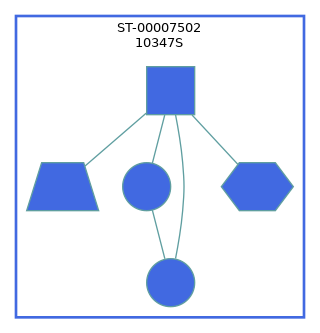

In [118]:
group_id = 107
display(Image(graph_thumbnail_generator.graph(group_id, shape_by='dataset_id')))

#### Symmetric

In [119]:
symmetric = subject_pairs_both_known[subject_pairs_both_known['left_cross_count'] == subject_pairs_both_known['right_cross_count']]
symmetric

,level_0,index,group_id,S_SUBJECTID,status,T,N,left_subject,right_subject,left_cross_count,right_cross_count,left_total_count,right_total_count
1,1,73,80,"[ST-00007475, ST-00007999]",review_cross_subject_matches,7,2,ST-00007475,ST-00007999,1.0,1.0,5.0,2.0
2,2,207,217,"[ST-00078703, ST-00007613]",review_cross_subject_matches,8,2,ST-00007613,ST-00078703,3.0,3.0,4.0,4.0
3,3,233,243,"[ST-00007639, ST-00038488]",review_cross_subject_matches,6,2,ST-00007639,ST-00038488,2.0,2.0,3.0,3.0
13,13,544,562,"[ST-00007958, ST-00078627]",review_cross_subject_matches,4,2,ST-00007958,ST-00078627,1.0,1.0,2.0,2.0
17,17,919,950,"[ST-00030659, ST-00078607]",review_cross_subject_matches,4,2,ST-00030659,ST-00078607,1.0,1.0,3.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
138,138,10322,10621,"[ST-00037798, ST-01024273]",review_cross_subject_matches,6,2,ST-00037798,ST-01024273,1.0,1.0,5.0,1.0
139,139,10323,10622,"[ST-00035217, ST-01024275]",review_cross_subject_matches,5,2,ST-00035217,ST-01024275,1.0,1.0,4.0,1.0
140,140,10324,10623,"[ST-00038049, ST-01024276]",review_cross_subject_matches,7,2,ST-00038049,ST-01024276,1.0,1.0,6.0,1.0
141,141,10325,10624,"[ST-01001881, ST-01024277]",review_cross_subject_matches,6,2,ST-01001881,ST-01024277,1.0,1.0,5.0,1.0


/udd/rejpz/.conda/envs/cdnm-jupyter-python-3.7.6/lib/python3.9/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


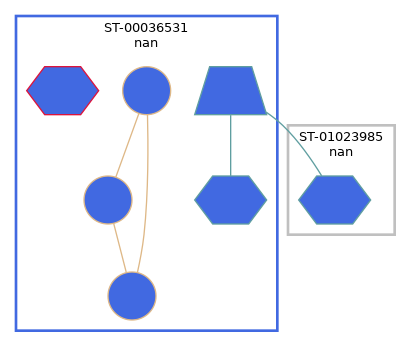

In [135]:
group_id = symmetric[symmetric['left_cross_count'] == 1].sample()['group_id'].values[0]
display(Image(graph_thumbnail_generator.graph(group_id, shape_by='dataset_id')))

In [358]:
symmetric[symmetric['left_cross_count'] > 1]

,level_0,index,group_id,S_SUBJECTID,status,T,N,left_subject,right_subject,left_cross_count,right_cross_count,left_total_count,right_total_count
4,4,229,243,"[ST-00007639, ST-00038488]",review_cross_subject_matches,6,2,ST-00007639,ST-00038488,2.0,2.0,3.0,3.0
30,30,1039,1096,"[ST-00033483, ST-00040564]",review_cross_subject_matches,6,2,ST-00033483,ST-00040564,3.0,3.0,3.0,3.0
31,31,1060,1117,"[ST-00033813, ST-00030665]",review_cross_subject_matches,4,2,ST-00030665,ST-00033813,2.0,2.0,2.0,2.0
39,39,1275,1369,"[ST-00037258, ST-00034537]",review_cross_subject_matches,8,2,ST-00034537,ST-00037258,2.0,2.0,2.0,6.0
50,50,1430,1551,"[ST-00073298, ST-00073299]",review_cross_subject_matches,4,2,ST-00073298,ST-00073299,2.0,2.0,2.0,2.0
52,52,1662,1804,"[ST-00074174, ST-00074138]",review_cross_subject_matches,9,2,ST-00074138,ST-00074174,3.0,3.0,5.0,4.0
60,60,2333,2507,"[ST-00074846, ST-00074841]",review_cross_subject_matches,9,2,ST-00074841,ST-00074846,3.0,3.0,3.0,6.0
61,61,2388,2565,"[ST-01006876, ST-00074904]",review_cross_subject_matches,11,2,ST-00074904,ST-01006876,3.0,3.0,5.0,6.0
80,80,3388,3610,"[ST-00075956, ST-00079265]",review_cross_subject_matches,8,2,ST-00075956,ST-00079265,3.0,3.0,4.0,4.0
149,149,8472,8910,"[ST-01005151, ST-01001455]",review_cross_subject_matches,5,2,ST-01001455,ST-01005151,2.0,2.0,2.0,3.0


In [91]:
group_id = symmetric[symmetric['left_cross_count'] == 3].sample()['group_id'].values[0]
display(Image(graph_generator.graph(group_id, shape_by='dataset_id')))

NameError: name 'symmetric' is not defined

## subject-trios

In [140]:
subject_trios = groups_with_metadata[groups_with_metadata.N == 3].reset_index()
subject_trios

,index,group_id,S_SUBJECTID,status,T,N
0,1165,1216,"[ST-00037113, ST-00035047, ST-00036398]",review_cross_subject_matches,10,3
1,1199,1258,"[ST-00035641, ST-01001876, ST-00033467]",review_cross_subject_matches,14,3
2,3792,3950,"[ST-00075602, ST-00078657, ST-00076296]",review_cross_subject_matches,13,3
3,3850,4011,"[ST-00076372, ST-00076352, ST-00076357]",review_cross_subject_matches,15,3
4,4983,5165,"[ST-00077531, ST-00077931, ST-01007179]",review_cross_subject_matches,14,3
5,6512,6746,"[ST-00078230, ST-00079123, ST-00078190]",review_cross_subject_matches,14,3
6,6925,7171,"[ST-01007707, ST-00080687, ST-00075738]",review_cross_subject_matches,13,3
7,9648,9943,"[ST-00007493, ST-00080607, ST-01007510]",review_cross_subject_matches,14,3
8,10319,10618,"[nan, ST-00033205, ST-01024266]",review_cross_subject_matches,8,3


In [141]:
subject_trios.group_id.values

array([ 1216,  1258,  3950,  4011,  5165,  6746,  7171,  9943, 10618])

/d/tmp/rejpz/ipykernel_8373/1311097262.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)
/udd/rejpz/.conda/envs/cdnm-jupyter-python-3.7.6/lib/python3.9/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


Extracted 1 subjects for group_id=10082: ['ST-01007672']
['NWD599731', '26004Y', 'TOE180533_203504570056_R08C01_337480', 'TOE590432_203508790057_R01C01_337481']


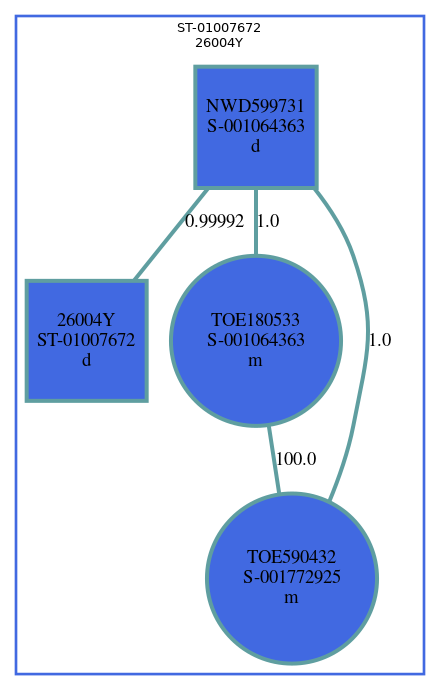

In [90]:
# 782 reassign ... ok
# 789 reassign ... ok
# 1216 same as 782
# 1258 reassign ... ok
# 1473 messy
# 1810  reassign ... ok
# 3299  ???
# 4011  reassign ... ok
# 5465 reassign ... ok
# 6691  reassign ... ok
# 7171 reassign ... ok
# 10082 ???
# 10623 bug
    
group_id = 10082
display(Image(graph_generator.graph(group_id, shape_by='dataset_id')))

## subject-quads

In [142]:

subject_quads = groups_with_metadata[groups_with_metadata.N == 4].reset_index()
subject_quads

,index,group_id,S_SUBJECTID,status,T,N
0,395,408,"[ST-00078728, ST-00078726, ST-00078723, ST-000...",review_cross_subject_matches,18,4
1,3378,3530,"[ST-00077106, ST-00074679, ST-00075876, ST-000...",review_cross_subject_matches,19,4
2,4351,4523,"[ST-00075705, ST-01005275, ST-00076878, ST-000...",review_cross_subject_matches,22,4
3,6146,6367,"[ST-00078744, ST-00078758, ST-00078872, ST-000...",review_cross_subject_matches,19,4
4,7948,8219,"[ST-00074320, ST-01003072, ST-00074673, ST-000...",review_cross_subject_matches,18,4


/d/tmp/rejpz/ipykernel_8373/1311097262.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)
/udd/rejpz/.conda/envs/cdnm-jupyter-python-3.7.6/lib/python3.9/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


Extracted 1 subjects for group_id=7080: ['ST-00079637']
['NWD649477', 'TOE332829_204076530111_R08C01_378728']


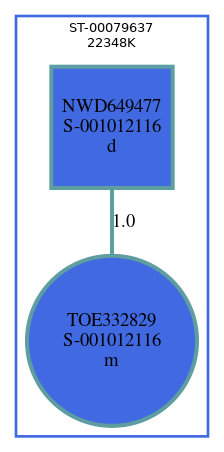

In [136]:
# 6 groups
# 408 chain, reassign ... ok
# 662 chain, reassign ... ok
# 1123 chain, reassign ... ok
# 2756 ???
# 6367 chain, reassign ... ok
# 7080 This one is interesting ... 

group_id = 7080
display(Image(graph_generator.graph(group_id, shape_by='dataset_id')))

### RNA: Zooming in on the tranch data to get the input filtering right

In [101]:
tranch_data = pd.read_csv(FREEZE_DIR/'tmp/tranch_counts_by_sample.txt', delim_whitespace=True, names=['SampleLabel', 'max', 'tranch_counts'])
tranch_data['max'] = tranch_data['max'].str.replace(':', '').astype(float)
tranch_data[['1Q', '2Q', '3Q', '4Q']] = tranch_data['tranch_counts'].str.split('-', expand=True).astype(int)
tranch_data

,SampleLabel,max,tranch_counts,1Q,2Q,3Q,4Q
0,S-001515512_accepted_hits.sorted.bam,0.1871,32256-0-0-3,32256,0,0,3
1,S-001553244_accepted_hits.sorted.bam,0.2745,32256-0-0-3,32256,0,0,3
2,S-001562079_accepted_hits.sorted.bam,0.2769,32256-0-0-3,32256,0,0,3
3,S-001562089_accepted_hits.sorted.bam,0.2126,32256-0-0-3,32256,0,0,3
4,S-001562121_accepted_hits.sorted.bam,0.2706,32256-0-0-3,32256,0,0,3
...,...,...,...,...,...,...,...
4842,S-001630867_S21_L004_accepted_hits.sorted.bam,0.2315,32256-0-0-3,32256,0,0,3
4843,S-001630889_S20_L001_accepted_hits.sorted.bam,0.1871,32256-0-0-3,32256,0,0,3
4844,S-001630889_S20_L002_accepted_hits.sorted.bam,0.1923,32250-6-0-3,32250,6,0,3
4845,S-001630889_S20_L003_accepted_hits.sorted.bam,0.1860,32256-0-0-3,32256,0,0,3


#### Compare these two

In [366]:
tranch_data[tranch_data['SampleLabel'].str.startswith('S-001562835')]

,SampleLabel,max,tranch_counts,1Q,2Q,3Q,4Q
1887,S-001562835_TAATGCGC-AGGCGAAG_L008_accepted_hi...,0.1115,10650-17412-4185-12,10650,17412,4185,12
3484,S-001562835_accepted_hits.sorted.bam,0.2462,32256-0-0-3,32256,0,0,3


In [367]:
tranch_data[tranch_data['SampleLabel'].str.startswith('S-001562944')]

,SampleLabel,max,tranch_counts,1Q,2Q,3Q,4Q
4482,S-001562944_S3_L001_accepted_hits.sorted.bam,0.0938,32235-21-0-3,32235,21,0,3
4483,S-001562944_S3_L002_accepted_hits.sorted.bam,0.0927,32253-3-0-3,32253,3,0,3
4484,S-001562944_S3_L003_accepted_hits.sorted.bam,0.0974,32094-162-0-3,32094,162,0,3
4485,S-001562944_S3_L004_accepted_hits.sorted.bam,0.0894,32235-21-0-3,32235,21,0,3


In [368]:
tranch_data[tranch_data['3Q'] == 0]

,SampleLabel,max,tranch_counts,1Q,2Q,3Q,4Q
0,S-001515512_accepted_hits.sorted.bam,0.1871,32256-0-0-3,32256,0,0,3
1,S-001553244_accepted_hits.sorted.bam,0.2745,32256-0-0-3,32256,0,0,3
2,S-001562079_accepted_hits.sorted.bam,0.2769,32256-0-0-3,32256,0,0,3
3,S-001562089_accepted_hits.sorted.bam,0.2126,32256-0-0-3,32256,0,0,3
4,S-001562121_accepted_hits.sorted.bam,0.2706,32256-0-0-3,32256,0,0,3
...,...,...,...,...,...,...,...
4842,S-001630867_S21_L004_accepted_hits.sorted.bam,0.2315,32256-0-0-3,32256,0,0,3
4843,S-001630889_S20_L001_accepted_hits.sorted.bam,0.1871,32256-0-0-3,32256,0,0,3
4844,S-001630889_S20_L002_accepted_hits.sorted.bam,0.1923,32250-6-0-3,32250,6,0,3
4845,S-001630889_S20_L003_accepted_hits.sorted.bam,0.1860,32256-0-0-3,32256,0,0,3


In [369]:
tranch_data[tranch_data['3Q'] != 0]['max'].idxmax()

623

In [370]:
tranch_data.loc[623]

SampleLabel      S-001520779_accepted_hits.sorted.bam
max                                            0.2939
tranch_counts                             32253-0-3-3
1Q                                              32253
2Q                                                  0
3Q                                                  3
4Q                                                  3
Name: 623, dtype: object

In [371]:
tranch_data[(tranch_data['4Q'] > 0) & (tranch_data['3Q'] == 0) & (tranch_data['max'] < 0.20)]['max'].idxmin()

4485

In [372]:
tranch_data.loc[4485]

SampleLabel      S-001562944_S3_L004_accepted_hits.sorted.bam
max                                                    0.0894
tranch_counts                                    32235-21-0-3
1Q                                                      32235
2Q                                                         21
3Q                                                          0
4Q                                                          3
Name: 4485, dtype: object

In [373]:
tranch_data[tranch_data['SampleLabel'].str.startswith('S-001562944')]

,SampleLabel,max,tranch_counts,1Q,2Q,3Q,4Q
4482,S-001562944_S3_L001_accepted_hits.sorted.bam,0.0938,32235-21-0-3,32235,21,0,3
4483,S-001562944_S3_L002_accepted_hits.sorted.bam,0.0927,32253-3-0-3,32253,3,0,3
4484,S-001562944_S3_L003_accepted_hits.sorted.bam,0.0974,32094-162-0-3,32094,162,0,3
4485,S-001562944_S3_L004_accepted_hits.sorted.bam,0.0894,32235-21-0-3,32235,21,0,3


In [374]:
tranch_data[tranch_data['max'] < 0.20]

,SampleLabel,max,tranch_counts,1Q,2Q,3Q,4Q
0,S-001515512_accepted_hits.sorted.bam,0.1871,32256-0-0-3,32256,0,0,3
21,S-001613482_S23_L001_accepted_hits.sorted.bam,0.1740,30858-1398-0-3,30858,1398,0,3
22,S-001613482_S23_L002_accepted_hits.sorted.bam,0.1770,31611-645-0-3,31611,645,0,3
23,S-001613482_S23_L003_accepted_hits.sorted.bam,0.1771,30909-1347-0-3,30909,1347,0,3
24,S-001613482_S23_L004_accepted_hits.sorted.bam,0.1775,30936-1320-0-3,30936,1320,0,3
...,...,...,...,...,...,...,...
4834,S-001630861_S8_L004_accepted_hits.sorted.bam,0.1255,29568-2619-69-3,29568,2619,69,3
4843,S-001630889_S20_L001_accepted_hits.sorted.bam,0.1871,32256-0-0-3,32256,0,0,3
4844,S-001630889_S20_L002_accepted_hits.sorted.bam,0.1923,32250-6-0-3,32250,6,0,3
4845,S-001630889_S20_L003_accepted_hits.sorted.bam,0.1860,32256-0-0-3,32256,0,0,3


#### Look in-depth at one batch worth of RNA data

In [375]:
batch = pd.read_csv(FREEZE_DIR/'tmp/batch_16_170411_7001411_0495_BCARJAANXX_king.csv', usecols=['IID_orig_x', 'IID_orig_y', 'Kinship'])
batch_rna_wgs = batch[(batch.IID_orig_x.str.startswith('NWD') & batch.IID_orig_y.str.startswith('S-'))]
groups_by_sample = batch_rna_wgs.groupby('IID_orig_y')

filtered_results = []
for (rna_sample, group) in groups_by_sample:
    max = group['Kinship'].max()
    s25 = max * 0.25
    s50 = max * 0.50
    s75 = max * 0.75
    n0 = group[group.Kinship < s25].size
    n25 = group[(group.Kinship >= s25) & (group.Kinship < s50)].size
    n50 = group[(group.Kinship >= s50) & (group.Kinship < s75)].size
    tranch75 = group[group.Kinship >= s75]
    n75 = tranch75.size
    if n75 <= 12:
        filtered_results.append(tranch75)
    print(f'{rna_sample} {max}: {n0}-{n25}-{n50}-{n75}')

    ### Save the n75 group to the filtered_results
filtered_results = pd.concat(filtered_results)
filtered_results

S-001562119_ATTACTCG-TATAGCCT_L001_accepted_hits.sorted.bam 0.2311: 32256-0-0-3
S-001562120_ATTACTCG-ATAGAGGC_L001_accepted_hits.sorted.bam 0.358: 32256-0-0-3
S-001562121_ATTACTCG-CCTATCCT_L001_accepted_hits.sorted.bam 0.2009: 32256-0-0-3
S-001562122_ATTACTCG-GGCTCTGA_L001_accepted_hits.sorted.bam 0.1352: 32256-0-0-3
S-001562124_ATTACTCG-AGGCGAAG_L001_accepted_hits.sorted.bam 0.2582: 32256-0-0-3
S-001562132_ATTACTCG-TAATCTTA_L001_accepted_hits.sorted.bam 0.2387: 32256-0-0-3
S-001562133_ATTACTCG-CAGGACGT_L001_accepted_hits.sorted.bam 0.2801: 32256-0-0-3
S-001562134_ATTACTCG-GTACTGAC_L001_accepted_hits.sorted.bam 0.2783: 32256-0-0-3
S-001562135_TCCGGAGA-TATAGCCT_L002_accepted_hits.sorted.bam 0.2298: 32256-0-0-3
S-001562136_TCCGGAGA-ATAGAGGC_L002_accepted_hits.sorted.bam 0.2656: 32256-0-0-3
S-001562137_TCCGGAGA-CCTATCCT_L002_accepted_hits.sorted.bam 0.2571: 32256-0-0-3
S-001562139_TCCGGAGA-GGCTCTGA_L002_accepted_hits.sorted.bam 0.2523: 32253-0-0-6
S-001562140_TCCGGAGA-AGGCGAAG_L002_accept

,IID_orig_x,IID_orig_y,Kinship
58252295,NWD304752,S-001562119_ATTACTCG-TATAGCCT_L001_accepted_hi...,0.2311
57810602,NWD304752,S-001562120_ATTACTCG-ATAGAGGC_L001_accepted_hi...,0.3580
57825420,NWD644339,S-001562121_ATTACTCG-CCTATCCT_L001_accepted_hi...,0.2009
57839524,NWD928758,S-001562122_ATTACTCG-GGCTCTGA_L001_accepted_hi...,0.1352
58228143,NWD995141,S-001562124_ATTACTCG-AGGCGAAG_L001_accepted_hi...,0.2582
...,...,...,...
58026627,NWD370890,S-001564129_CGCTCATT-TAATCTTA_L003_accepted_hi...,0.2382
58242551,NWD394647,S-001564130_CGCTCATT-CAGGACGT_L003_accepted_hi...,0.2761
58034186,NWD102758,S-001564131_CGCTCATT-GTACTGAC_L003_accepted_hi...,0.2132
58047014,NWD272213,S-001564133_GAGATTCC-TATAGCCT_L004_accepted_hi...,0.2158


In [376]:
batch = pd.read_csv(FREEZE_DIR/'tmp/batch_16_170411_7001411_0495_BCARJAANXX_king.csv', usecols=['IID_orig_x', 'IID_orig_y', 'Kinship'])
batch_rna_wgs = batch[(batch.IID_orig_x.str.startswith('NWD') & batch.IID_orig_y.str.startswith('S-'))]
groups_by_sample = batch_rna_wgs.groupby('IID_orig_y')

filtered_results = []
for (rna_sample, group) in groups_by_sample:
    max = group['Kinship'].max()
    s25 = max * 0.25
    s50 = max * 0.50
    sTop = max * 0.90
    n0 = group[group.Kinship < s25].size
    n25 = group[(group.Kinship >= s25) & (group.Kinship < s50)].size
    n50 = group[(group.Kinship >= s50) & (group.Kinship < sTop)].size
    tranchTop = group[group.Kinship >= sTop]
    nTop = tranch75.size
    if nTop <= 12:
        filtered_results.append(tranchTop)
    print(f'{rna_sample} {max}: {n0}-{n25}-{n50}-{nTop}')

    ### Save the n75 group to the filtered_results
filtered_results = pd.concat(filtered_results)
filtered_results

S-001562119_ATTACTCG-TATAGCCT_L001_accepted_hits.sorted.bam 0.2311: 32256-0-0-3
S-001562120_ATTACTCG-ATAGAGGC_L001_accepted_hits.sorted.bam 0.358: 32256-0-0-3
S-001562121_ATTACTCG-CCTATCCT_L001_accepted_hits.sorted.bam 0.2009: 32256-0-0-3
S-001562122_ATTACTCG-GGCTCTGA_L001_accepted_hits.sorted.bam 0.1352: 32256-0-0-3
S-001562124_ATTACTCG-AGGCGAAG_L001_accepted_hits.sorted.bam 0.2582: 32256-0-0-3
S-001562132_ATTACTCG-TAATCTTA_L001_accepted_hits.sorted.bam 0.2387: 32256-0-0-3
S-001562133_ATTACTCG-CAGGACGT_L001_accepted_hits.sorted.bam 0.2801: 32256-0-0-3
S-001562134_ATTACTCG-GTACTGAC_L001_accepted_hits.sorted.bam 0.2783: 32256-0-0-3
S-001562135_TCCGGAGA-TATAGCCT_L002_accepted_hits.sorted.bam 0.2298: 32256-0-0-3
S-001562136_TCCGGAGA-ATAGAGGC_L002_accepted_hits.sorted.bam 0.2656: 32256-0-0-3
S-001562137_TCCGGAGA-CCTATCCT_L002_accepted_hits.sorted.bam 0.2571: 32256-0-0-3
S-001562139_TCCGGAGA-GGCTCTGA_L002_accepted_hits.sorted.bam 0.2523: 32253-0-0-3
S-001562140_TCCGGAGA-AGGCGAAG_L002_accept

,IID_orig_x,IID_orig_y,Kinship
58252295,NWD304752,S-001562119_ATTACTCG-TATAGCCT_L001_accepted_hi...,0.2311
57810602,NWD304752,S-001562120_ATTACTCG-ATAGAGGC_L001_accepted_hi...,0.3580
57825420,NWD644339,S-001562121_ATTACTCG-CCTATCCT_L001_accepted_hi...,0.2009
57839524,NWD928758,S-001562122_ATTACTCG-GGCTCTGA_L001_accepted_hi...,0.1352
58228143,NWD995141,S-001562124_ATTACTCG-AGGCGAAG_L001_accepted_hi...,0.2582
...,...,...,...
58026627,NWD370890,S-001564129_CGCTCATT-TAATCTTA_L003_accepted_hi...,0.2382
58242551,NWD394647,S-001564130_CGCTCATT-CAGGACGT_L003_accepted_hi...,0.2761
58034186,NWD102758,S-001564131_CGCTCATT-GTACTGAC_L003_accepted_hi...,0.2132
58047014,NWD272213,S-001564133_GAGATTCC-TATAGCCT_L004_accepted_hi...,0.2158


In [380]:
masterfile = pd.read_csv('/proj/edith/regeps/regep00/studies/COPDGene/data/rnaseq/BLOOD/archivalroot/Masterfile/master.file.freeze4.txt', sep='\t')
masterfile

,sample_id,sample,COPDgeneID,actual_id,BAM_file,in_star_report,in_metrics,in_pearson,in_spearman,in_sample_sex,...,pass_pearson_corr,pass_kinship,user_keep,process,notes,final.analyzed,batch,BAM_id,RNA_id,Lc.Batch
0,S-001177272,S-001177272_TCCGCGAA-GTACTGAC_L005,10866Q,10934H,S-001177272_TCCGCGAA-GTACTGAC_L005_accepted_hi...,True,True,True,True,True,...,True,False,True,link,NaN,1,batch_13_170209_7001411_0478_BC9TG3ANXX,10934H_batch_13_170209_7001411_0478_BC9TG3ANXX...,10934H_batch_13_170209_7001411_0478_BC9TG3ANXX,7780150303-4
1,S-001177736,S-001177736_AGCGATAG-GTACTGAC_L008,20729M,20729M,S-001177736_AGCGATAG-GTACTGAC_L008_accepted_hi...,True,True,True,True,True,...,True,True,True,link,NaN,1,batch_49_180828_7001411_0771_BCCFY9ANXX,20729M_batch_49_180828_7001411_0771_BCCFY9ANXX...,20729M_batch_49_180828_7001411_0771_BCCFY9ANXX,12762376589_4
2,S-001178531,S-001178531_TCTCGCGC-TATAGCCT_L006,15730Q,11620P,S-001178531_TCTCGCGC-TATAGCCT_L006_accepted_hi...,True,True,True,True,True,...,True,False,True,link,NaN,1,batch_13_170209_7001411_0478_BC9TG3ANXX,11620P_batch_13_170209_7001411_0478_BC9TG3ANXX...,11620P_batch_13_170209_7001411_0478_BC9TG3ANXX,7780150303-4
3,S-001178538,S-001178538_ATTACTCG-AGGCGAAG_L004,11126H,11126H,S-001178538_ATTACTCG-AGGCGAAG_L004_accepted_hi...,True,True,True,True,True,...,True,True,True,link,NaN,1,161004_7001411_0434,11126H_161004_7001411_0434.bam,11126H_161004_7001411_0434,6093890587-3
4,S-001178548,S-001178548_TCTCGCGC-ATAGAGGC_L006,15039G,12534B,S-001178548_TCTCGCGC-ATAGAGGC_L006_accepted_hi...,True,True,True,True,True,...,True,False,True,link,NaN,1,batch_13_170209_7001411_0478_BC9TG3ANXX,12534B_batch_13_170209_7001411_0478_BC9TG3ANXX...,12534B_batch_13_170209_7001411_0478_BC9TG3ANXX,7780150303-4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4799,S-001648320,S-001648320_CCAAGTCT-AAGGATGA_L002,19433E,19433E,S-001648320_CCAAGTCT-AAGGATGA_L002_accepted_hi...,True,True,True,True,True,...,True,False,True,drop,failed.kinship,0,batch_79_190920_7001411_0894_ACDMJNANXX,19433E_batch_79_190920_7001411_0894_ACDMJNANXX...,19433E_batch_79_190920_7001411_0894_ACDMJNANXX,NaN
4800,S-001648321,S-001648321_TGGATCGA-GTGCGATA_L001,24728E,24728E,S-001648321_TGGATCGA-GTGCGATA_L001_accepted_hi...,True,True,True,True,True,...,True,False,True,drop,failed.kinship,0,batch_79_190920_7001411_0894_ACDMJNANXX,24728E_batch_79_190920_7001411_0894_ACDMJNANXX...,24728E_batch_79_190920_7001411_0894_ACDMJNANXX,NaN
4801,S-001648322,S-001648322_GGACTTGG-CGCAGACG_L001,23798U,23798U,S-001648322_GGACTTGG-CGCAGACG_L001_accepted_hi...,True,True,True,True,True,...,True,False,True,drop,failed.kinship,0,batch_79_190920_7001411_0894_ACDMJNANXX,23798U_batch_79_190920_7001411_0894_ACDMJNANXX...,23798U_batch_79_190920_7001411_0894_ACDMJNANXX,NaN
4802,S-001648323,S-001648323_TTGGACTC-GGAAGCAG_L002,25389N,25389N,S-001648323_TTGGACTC-GGAAGCAG_L002_accepted_hi...,True,True,True,True,True,...,True,False,True,drop,failed.kinship,0,batch_79_190920_7001411_0894_ACDMJNANXX,25389N_batch_79_190920_7001411_0894_ACDMJNANXX...,25389N_batch_79_190920_7001411_0894_ACDMJNANXX,NaN


In [385]:
masterfile['final.analyzed'].value_counts()

1    3985
0     819
Name: final.analyzed, dtype: int64

In [392]:
masterfile_with_tranches = masterfile.merge(tranch_data, left_on='BAM_file', right_on='SampleLabel')
masterfile_with_tranches[(masterfile_with_tranches['final.analyzed'] == 1) & (masterfile_with_tranches['3Q'] != 0)][['max', 'tranch_counts']]

,max,tranch_counts
148,0.2939,32253-0-3-3
337,0.0703,12756-9405-9672-426
347,0.2838,32253-0-3-3
601,0.0249,32079-144-33-3
619,0.2701,32253-0-3-3
701,0.1382,9063-1221-11205-10770
787,0.0383,20718-8289-2931-321
1060,0.1659,11541-20349-366-3
1283,0.2767,32253-0-3-3
1292,0.0167,32004-165-78-12


### RNA II: many unmatched_samples ... can we look at their tranches?

In [107]:
unmatched_rna = annotated_manifest[(annotated_manifest.dataset_id == 4) & (annotated_manifest.status == 'review_unmatched_sample')]
unmatched_rna


,Unnamed: 0,SampleLabel,S_SAMPLEID_manifest,SampleAlias,SampleTypeCode,dataset_id,is_reference,S_SUBJECTID,S_SAMPLEID,S_SUBJECTID_sample,...,u_specimentypeid,u_collectiontypid,u_legacyfamilyid,u_packageid,ExpectedGender,ObservedGender,flags,group_id,keep_drop,status
33637,33637,S-001178538_ATTACTCG-AGGCGAAG_L004_accepted_hi...,S-001178538,S-001178538_ATTACTCG-AGGCGAAG_L004_accepted_hi...,r,4,0,ST-00007689,S-001178538,ST-00007689,...,SP-0008,CT-GECOPD-0004,NaN,NaN,F,NaN,observed_gender_missing;unexpected_geno_nomatch,293,review,review_unmatched_sample
33641,33641,S-001486013_ATTACTCG-TAATCTTA_L001_accepted_hi...,S-001486013,S-001486013_ATTACTCG-TAATCTTA_L001_accepted_hi...,r,4,0,ST-00007416,S-001486013,ST-00007416,...,SP-0008,CT-GECOPD-0014,NaN,NaN,M,NaN,observed_gender_missing;unexpected_geno_nomatch,21,review,review_unmatched_sample
33732,33732,S-001522671_CGCTCATT-TATAGCCT_L001_accepted_hi...,S-001522671,S-001522671_CGCTCATT-TATAGCCT_L001_accepted_hi...,r,4,0,ST-00007911,S-001522671,ST-00007911,...,SP-0008,CT-GECOPD-0014,NaN,NaN,F,NaN,observed_gender_missing;unexpected_geno_nomatch,515,review,review_unmatched_sample
33733,33733,S-001522675_D02_CTTGTA_L002_accepted_hits.sort...,S-001522675,S-001522675_D02_CTTGTA_L002_accepted_hits.sort...,r,4,0,ST-00076513,S-001522675,ST-00076513,...,SP-0008,CT-GECOPD-0014,NaN,NaN,F,NaN,observed_gender_missing;unexpected_geno_nomatch,4164,review,review_unmatched_sample
33734,33734,S-001522676_G04_CAGATC_L004_accepted_hits.sort...,S-001522676,S-001522676_G04_CAGATC_L004_accepted_hits.sort...,r,4,0,ST-00078053,S-001522676,ST-00078053,...,SP-0008,CT-GECOPD-0014,NaN,NaN,M,NaN,observed_gender_missing;unexpected_geno_nomatch,5680,review,review_unmatched_sample
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37300,37300,S-001636285_accepted_hits.sorted.bam,S-001636285,S-001636285_accepted_hits.sorted.bam,r,4,0,ST-00077019,S-001636285,ST-00077019,...,SP-0008,CT-GECOPD-0014,NaN,NaN,M,NaN,observed_gender_missing;unexpected_geno_nomatch,4664,review,review_unmatched_sample
37301,37301,S-001636286_accepted_hits.sorted.bam,S-001636286,S-001636286_accepted_hits.sorted.bam,r,4,0,ST-00079636,S-001636286,ST-00079636,...,SP-0008,CT-GECOPD-0014,NaN,NaN,F,NaN,observed_gender_missing;unexpected_geno_nomatch,7079,review,review_unmatched_sample
37302,37302,S-001636290_accepted_hits.sorted.bam,S-001636290,S-001636290_accepted_hits.sorted.bam,r,4,0,ST-01006702,S-001636290,ST-01006702,...,SP-0008,CT-GECOPD-0014,NaN,NaN,M,NaN,observed_gender_missing;unexpected_geno_nomatch,9335,review,review_unmatched_sample
37303,37303,S-001636291_accepted_hits.sorted.bam,S-001636291,S-001636291_accepted_hits.sorted.bam,r,4,0,ST-01025778,S-001636291,ST-01025778,...,SP-0008,CT-GECOPD-0020,NaN,NaN,M,NaN,observed_gender_missing;unexpected_geno_nomatch,10703,review,review_unmatched_sample


In [108]:
unmatched_rna = unmatched_rna.merge(tranch_data, on='SampleLabel')
unmatched_rna[['SampleLabel', 'group_id', 'max', 'tranch_counts']]

,SampleLabel,group_id,max,tranch_counts
0,S-001539058_TATCGCAC-CTTAGTGT_L008_accepted_hi...,2014,0.2355,32256-0-0-3
1,S-001542875_TCTCGCGC-GTACTGAC_L004_accepted_hi...,6146,0.1458,32256-0-0-3
2,S-001549458_TCCGGAGA-GGCTCTGA_L002_accepted_hi...,5294,0.0703,12756-9405-9672-426
3,S-001562018_TCCGCGAA-GGCTCTGA_L001_accepted_hi...,5248,0.0249,32079-144-33-3
4,S-001564795_TCTCGCGC-TATAGCCT_L007_accepted_hi...,7992,0.2529,32256-0-0-3
5,S-001564948_ACAGGCGC-CTCTGCCT_L006_accepted_hi...,5853,0.2504,32256-0-0-3
6,S-001564948_ACAGGCGC-CTCTGCCT_L006_accepted_hi...,5853,0.2504,32256-0-0-3
7,S-001564948_ACAGGCGC-CTCTGCCT_L006_accepted_hi...,5853,0.2504,32256-0-0-3
8,S-001572819_TCCGCGAA-CCTATCCT_L002_accepted_hi...,4043,0.1475,32256-0-0-3
9,S-001589128_CAATTAAC-CGAGATAT_L002_accepted_hi...,9053,0.2712,32256-0-0-3


## subject-pents

In [143]:

subject_pents = groups_with_metadata[groups_with_metadata.N == 5].reset_index()
subject_pents

,index,group_id,S_SUBJECTID,status,T,N
0,3881,4045,"[ST-00076345, ST-00076391, ST-00076383, ST-000...",review_cross_subject_matches,24,5


/d/tmp/rejpz/ipykernel_24801/1311097262.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)
/udd/rejpz/.conda/envs/cdnm-jupyter-python-3.7.6/lib/python3.9/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


Extracted 5 subjects for group_id=4045: ['ST-00076381', 'ST-00076383', 'ST-00076397', 'ST-00076345', 'ST-00076391']
['NWD104086', 'NWD419232', 'NWD686813', 'NWD745598', 'NWD958693', '18434B', '21011W', '21123H', '21340P', '21802B', 'TOE600330_203516060108_R05C01_349347', 'TOE463147_203497730146_R08C01_338108', 'TOE877106_203497730176_R06C01_338132', 'TOE650694_203829800157_R03C01_355312', 'TOE532893_203497730223_R03C01_338140', 'TOE724799_203806760122_R06C01_349402', 'TOE132903_203299670006_R07C01_337321', 'TOE216918_203504440108_R02C01_338065', 'TOE476559_203829800134_R02C01_355277', 'S-001610568_TAATGCGC-TAATCTTA_L004_accepted_hits.sorted.bam', 'S-001610569_TAATGCGC-CAGGACGT_L004_accepted_hits.sorted.bam', 'S-001611774_TCCGCGAA-TATAGCCT_L006_accepted_hits.sorted.bam', 'S-001611776_TCCGCGAA-ATAGAGGC_L006_accepted_hits.sorted.bam', 'S-001611777_TCCGCGAA-CCTATCCT_L006_accepted_hits.sorted.bam']


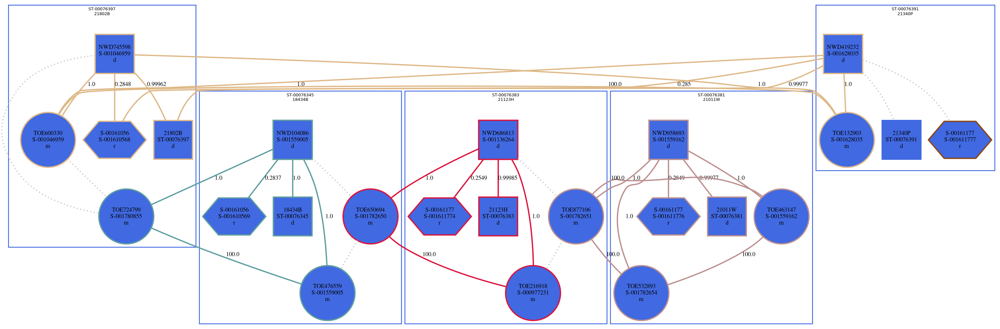

In [395]:
# 1636
# 3801
# 4045
group_id = 4045
display(Image(graph_generator.graph(group_id, shape_by='dataset_id')))

## "batch_level_event" is anything where # subjects > 5

In [144]:
batch_level_events = groups_with_metadata[groups_with_metadata.N > 5].reset_index()
batch_level_events

,index,group_id,S_SUBJECTID,status,T,N
0,2371,2498,"[ST-00075563, ST-00074132, ST-00074592, ST-000...",review_cross_subject_matches,77,16
1,2547,2677,"[ST-00031625, ST-00075016, ST-00008146, ST-000...",review_cross_subject_matches,28,6
2,2583,2719,"[ST-00075665, ST-00075025, ST-00075027, ST-000...",review_cross_subject_matches,29,6
3,6066,6279,"[ST-00074593, ST-01007280, ST-00078654, ST-000...",review_cross_subject_matches,54,11
4,6642,6876,"[ST-00077944, ST-00075017, ST-00079254, ST-010...",review_cross_subject_matches,39,8
5,6728,6963,"[ST-00036759, ST-00078674, ST-00076000, ST-000...",review_cross_subject_matches,54,11
6,8811,9091,"[ST-00075064, ST-01005333, ST-00034787, ST-000...",review_cross_subject_matches,44,9
7,10321,10620,"[ST-00037405, ST-00080137, ST-00073520, ST-000...",review_cross_subject_matches,154,34


/d/tmp/rejpz/ipykernel_24801/1311097262.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)
/udd/rejpz/.conda/envs/cdnm-jupyter-python-3.7.6/lib/python3.9/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


Extracted 12 subjects for group_id=9123: ['ST-00035597', 'ST-00037424', 'ST-01005366', 'ST-00077531', 'ST-01007510', 'ST-01020105', 'ST-00080607', 'ST-01007179', 'ST-00035888', 'ST-01001502', 'ST-00077931', 'ST-00007493']
['NWD105441', 'NWD153243', 'NWD236043', 'NWD304791', 'NWD311818', 'NWD706595', 'NWD774379', 'NWD805560', 'NWD868088', 'NWD896755', 'NWD913996', 'NWD941766', '10168S', '10314D', '16349A', '18437H', '18842Q', '20728K', '22389Y', '22630D', '24041U', 'TOE830939_203301400034_R08C01_337408', 'TOE111216_203675380131_R05C01_353421', 'TOE193085_203714600069_R02C01_353362', 'TOE208797_203866300065_R04C01_369434', 'TOE681187_203824900038_R08C01_355753', 'TOE290429_203866300065_R03C01_369433', 'TOE585193_203299670034_R01C01_337409', 'TOE219436_203504570052_R06C01_338269', 'TOE345731_203712390014_R07C01_346319', 'TOE328974_204234730096_R03C01_381628', 'TOE955505_203524200087_R05C01_349313', 'TOE202317_203829800040_R01C01_355754', 'TOE446429_203504570052_R07C01_338270', 'TOE186466_

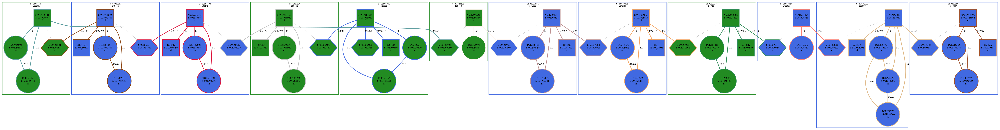

In [394]:
# 379  chain
# 4523 chain
# 8734 chain
# 2567 chain
# 2521 chain
# 6981 chain
# 9033 chain
# 9123 chain
#### 
# 9937
# 3950
# 8460
# 10625
# 10628
# 8108
group_id = 9123
display(Image(graph_generator.graph(group_id, shape_by='dataset_id')))

# Status Discussion

I am going to walk through each of the "status" types

## pass_isolate (98)

In [18]:
pass_isolates = annotated_manifest[annotated_manifest['status'] == 'pass_isolate']
pass_isolates.groupby('dataset_id').size()

dataset_id
0    56
1    40
4     2
dtype: int64

## pass (9403)

Groups that are passing (by definition, each of these corresponds to one subject)

In [201]:
passing = annotated_manifest[annotated_manifest['status'] == 'pass']
passing.groupby('dataset_id').size()

dataset_id
0     9427
1     9219
2    10863
3      321
4     3719
dtype: int64

(array([2880.,    0., 1867.,    0.,    0., 1779.,    0., 2456.,    0.,
           0.,  182.,    0.,  148.,    0.,    0.,   80.,    0.,    4.,
           0.,    7.]),
 array([ 2. ,  2.4,  2.8,  3.2,  3.6,  4. ,  4.4,  4.8,  5.2,  5.6,  6. ,
         6.4,  6.8,  7.2,  7.6,  8. ,  8.4,  8.8,  9.2,  9.6, 10. ]),
 <BarContainer object of 20 artists>)

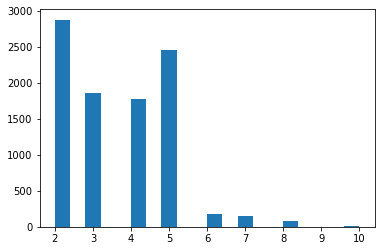

In [20]:
plt.hist(passing.groupby('group_id').size(), bins=20)

In [202]:
passing.group_id.mode()

0     358
1    7638
2    7671
3    7910
4    8898
5    8994
6    9097
dtype: int64

/d/tmp/rejpz/ipykernel_24801/3914984786.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


['NWD529413', '11528B', 'TOE506462_203867050099_R01C01_364732', 'TOE855831_203867050099_R02C01_364733', 'TOE729374_203867050093_R08C01_364731', '303617', 'S-001615515_S13_L001_accepted_hits.sorted.bam', 'S-001615515_S13_L002_accepted_hits.sorted.bam', 'S-001615515_S13_L003_accepted_hits.sorted.bam', 'S-001615515_S13_L004_accepted_hits.sorted.bam']


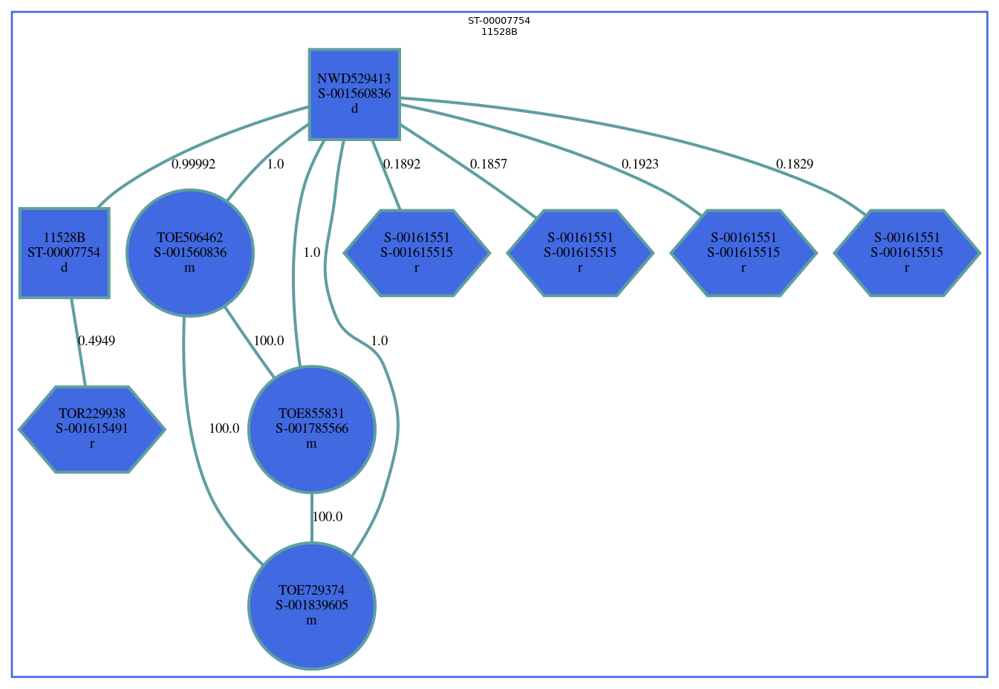

In [203]:
GROUP_ID = 358
display(Image(graph_generator.graph(GROUP_ID, shape_by='SampleTypeCode')))

## review-unknown (422)

In [26]:
### review-unknown
review_unknown = annotated_manifest[annotated_manifest['status'] == 'review-unknown']
review_unknown.groupby('dataset_id').size()

dataset_id
0    420
1     94
2    426
3     16
4    305
dtype: int64

In [27]:
review_unknown.group_id.mode()

0    1273
dtype: int64

/d/tmp/rejpz/ipykernel_4736/1977747252.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


['NWD704203', '13162V', 'TOE289093_203824900108_R05C01_354851', 'TOE224513_203824900108_R06C01_354852', 'S-001553111_S15_L001_accepted_hits.sorted.bam', 'S-001553111_S15_L002_accepted_hits.sorted.bam', 'S-001553111_S15_L003_accepted_hits.sorted.bam', 'S-001553111_S15_L004_accepted_hits.sorted.bam']
[{'S-001553111_S15_L001_accepted_hits.sorted.bam', 'S-001553111_S15_L004_accepted_hits.sorted.bam', 'NWD704203', 'S-001553111_S15_L003_accepted_hits.sorted.bam', '13162V', 'TOE289093_203824900108_R05C01_354851', 'S-001553111_S15_L002_accepted_hits.sorted.bam', 'TOE224513_203824900108_R06C01_354852'}]


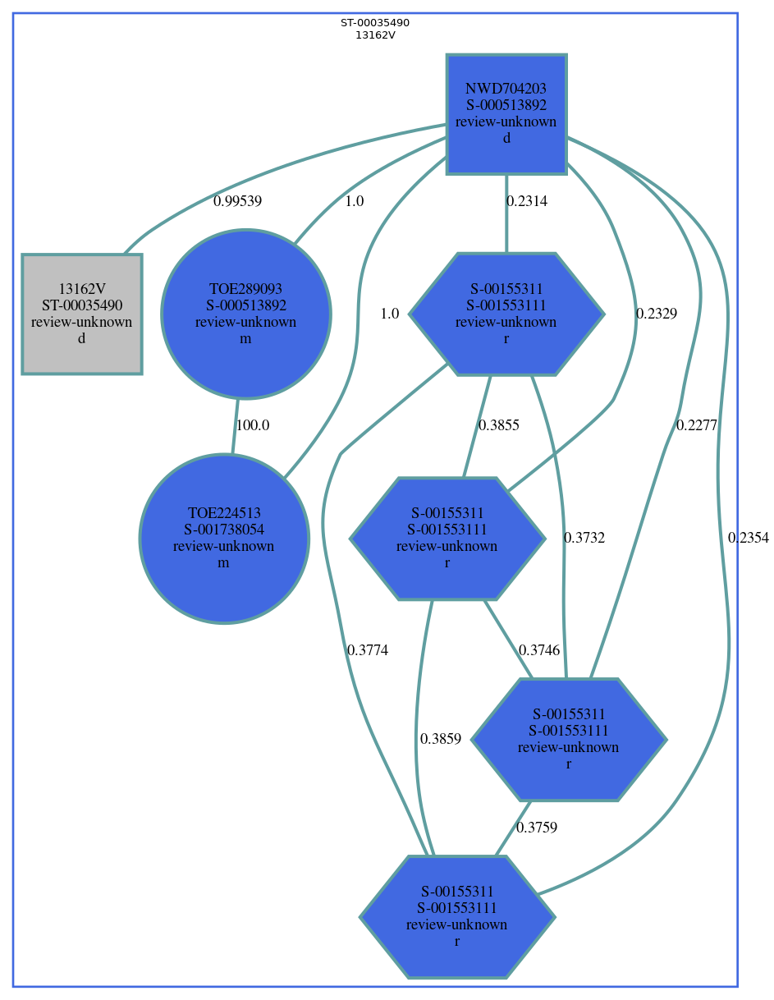

In [155]:
GROUP_ID = 1273
display(Image(graph_generator.graph(GROUP_ID, shape_by='SampleTypeCode')))

/d/tmp/rejpz/ipykernel_4736/1815009247.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


['NWD493238', '10550P', 'TOE258435_203867050004_R07C01_358786', 'TOE643871_203867050004_R08C01_358787', 'S-001569610_TCATCCTT-AGCGAGCT_L003_accepted_hits.sorted.bam']


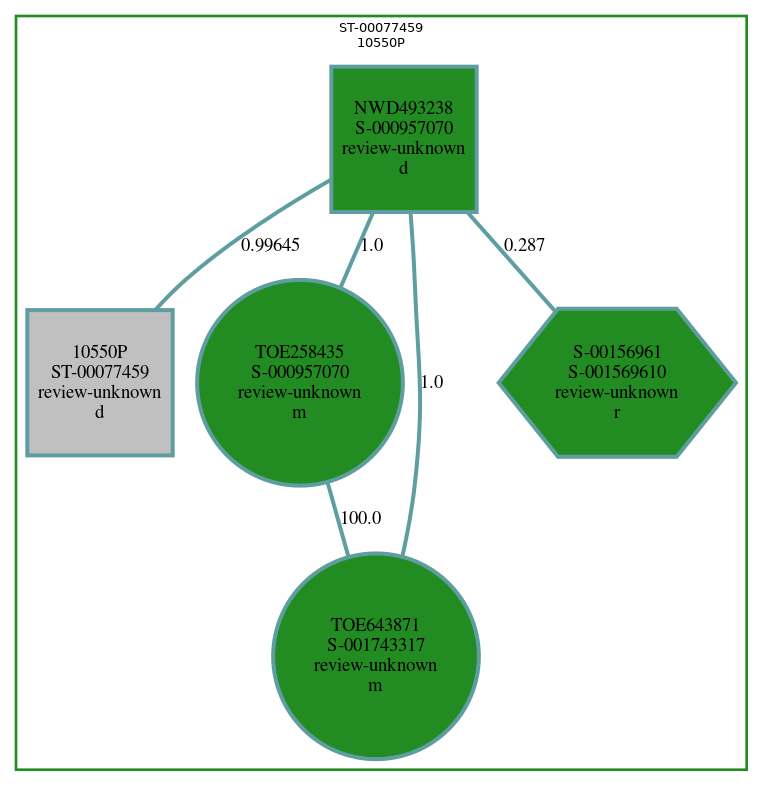

In [209]:
GROUP_ID = review_unknown.sample()['group_id'].values[0]
display(Image(graph_generator.graph(GROUP_ID, shape_by='SampleTypeCode')))

## review_gender_mismatch (68)

In [157]:
review_gender_mismatch = annotated_manifest[annotated_manifest['status'] == 'review_gender_mismatch']
review_gender_mismatch.groupby('dataset_id').size()

dataset_id
0    43
1    30
2    31
3    20
4    32
dtype: int64

In [31]:
len(review_gender_mismatch.groupby('group_id').groups)

68

/d/tmp/rejpz/ipykernel_4736/1815009247.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


['NWD597630', '17675S', 'TOE153095_204297500087_R02C01_381776', 'S-001553373_AAGTCCAA-TATGAGTA_L001_accepted_hits.sorted.bam']


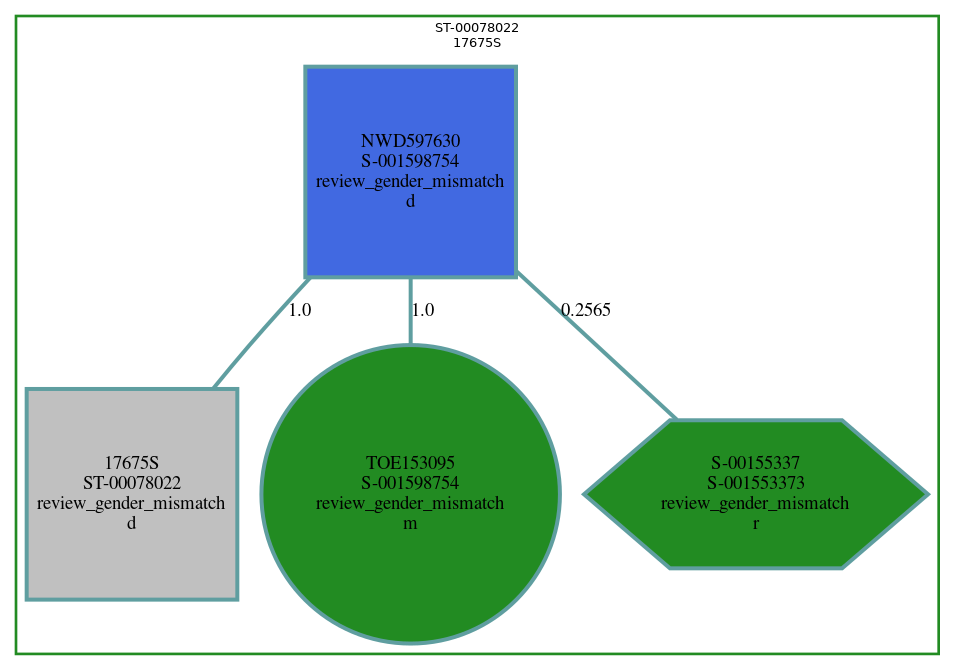

In [196]:
GROUP_ID = review_gender_mismatch.sample()['group_id'].values[0]
display(Image(graph_generator.graph(GROUP_ID, shape_by='SampleTypeCode')))

/d/tmp/rejpz/ipykernel_4736/1815009247.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


['NWD427449']


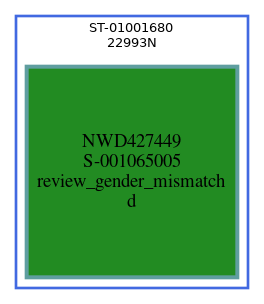

In [194]:
ST_01001680 = annotated_manifest[annotated_manifest['S_SUBJECTID'] == 'ST-01001680']['group_id'].values[0]
display(Image(graph_generator.graph(ST_01001680, shape_by='SampleTypeCode')))

## review-unmatched-sample

In [34]:
review_unmatched_sample = annotated_manifest[annotated_manifest['status'] == 'review_unmatched_sample']
review_unmatched_sample.groupby('dataset_id').size()

dataset_id
0    30
1    29
2    42
3     1
4    17
dtype: int64

In [35]:
len(review_unmatched_sample.groupby('group_id').groups)

29

/d/tmp/rejpz/ipykernel_4736/2528429817.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


['NWD170557', '11358C', 'TOE694981_203829800060_R08C01_354977', 'TOE248855_203829800046_R01C01_354943', 'S-001540082_AGCGATAG-ATAGAGGC_L004_accepted_hits.sorted.bam']


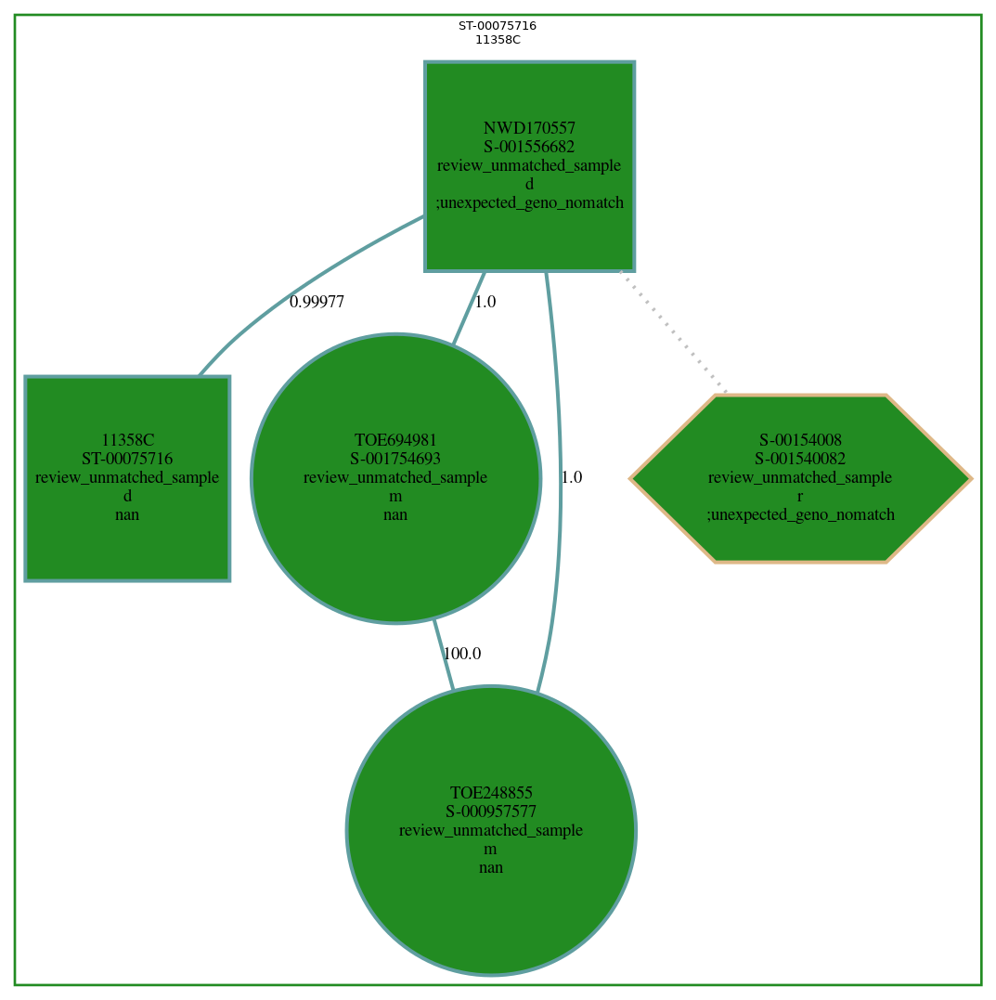

In [221]:
GROUP_ID = review_unmatched_sample.sample()['group_id'].values[0]
display(Image(graph_generator.graph(GROUP_ID, shape_by='SampleTypeCode')))

## review_cross_subject_matches (229)

In [37]:
review_cross_subject_matches = annotated_manifest[annotated_manifest['status'] == 'review_cross_subject_matches']
review_cross_subject_matches.groupby('dataset_id').size()

dataset_id
0     763
1     635
2    1033
3      20
4     640
dtype: int64

In [38]:
review_cross_subject_matches.shape

(3091, 19)

(array([ 87., 110.,  11.,   2.,   4.,   1.,   0.,   1.,   1.,   0.,   2.,
          4.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   2.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   1.,   1.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   1.]),
 array([  2.  ,   7.04,  12.08,  17.12,  22.16,  27.2 ,  32.24,  37.28,
         42.32,  47.36,  52.4 ,  57.44,  62.48,  67.52,  72.56,  77.6 ,
         82.64,  87.68,  92.72,  97.76, 102.8 , 107.84, 112.88, 117.92,
        122.96, 128.  , 133.04, 138.08, 143.12, 148.16, 153.2 , 158.24,
        163.28, 168.32, 173.36, 178.4 , 183.44, 188.48, 193.52, 198.56,
        203.6 , 208.64, 213.68, 218.72, 223.76, 228.8 , 233.84, 238.88,
        243.92, 248.96, 254.  ]),
 <BarContainer object of 50 artists>)

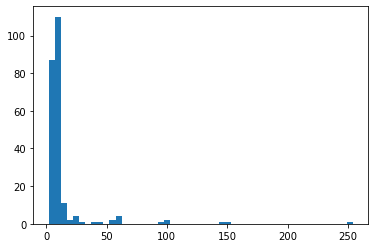

In [39]:
plt.hist(review_cross_subject_matches.groupby('group_id').size(), bins=50)

(array([ 0., 16.,  8., 12., 15., 10., 26., 22., 30., 30., 24.,  4.,  2.,
         1.,  4.,  1.,  3.,  0.,  1.,  1.]),
 array([ 1.  ,  1.95,  2.9 ,  3.85,  4.8 ,  5.75,  6.7 ,  7.65,  8.6 ,
         9.55, 10.5 , 11.45, 12.4 , 13.35, 14.3 , 15.25, 16.2 , 17.15,
        18.1 , 19.05, 20.  ]),
 <BarContainer object of 20 artists>)

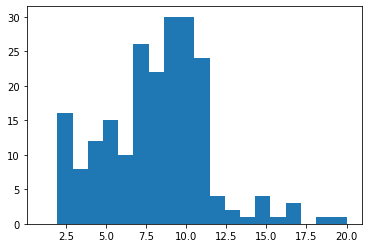

In [40]:
plt.hist(review_cross_subject_matches.groupby('group_id').size(), bins=20, range=[1, 20])


### Most common cases

In [41]:
### Let's find some that are size 10
group_sizes = review_cross_subject_matches.groupby('group_id').size().to_frame(name='size')
group_sizes[group_sizes['size'] == 10]

,size
group_id,
444,10
854,10
989,10
1241,10
1271,10
1399,10
1488,10
1520,10
2120,10


/d/tmp/rejpz/ipykernel_4736/2528429817.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


['NWD235995', 'NWD318774', '11232G', '25936Q', 'TOE615070_203299670078_R03C01_337595', 'TOE142917_203504440070_R08C01_338034', 'TOE728052_203299670078_R04C01_337596', 'TOE307136_203867050028_R03C01_337843', 'S-001605406_GAGATTCC-CCTATCCT_L004_accepted_hits.sorted.bam', 'S-001608412_TAATACAG-ATATTCAC_L007_accepted_hits.sorted.bam']


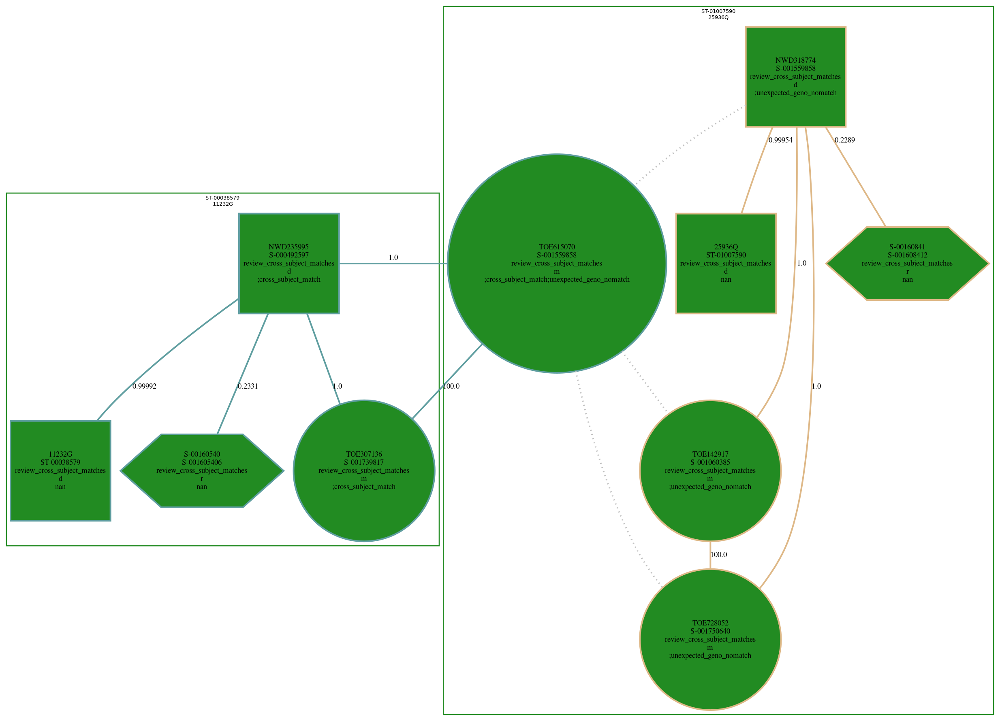

In [222]:
GROUP_ID = 10046
display(Image(graph_generator.graph(GROUP_ID, shape_by='SampleTypeCode')))

### BIG Groups! :-(

In [43]:
BIG_GROUP_SIZE = 17
group_sizes[group_sizes['size'] > BIG_GROUP_SIZE].size

21

In [44]:
group_sizes[group_sizes['size'] > BIG_GROUP_SIZE]

,size
group_id,
406,44
689,20
1661,38
2546,59
2592,60
2781,23
3826,24
3975,101
4070,24


/d/tmp/rejpz/ipykernel_4736/2528429817.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


['NWD142522', 'NWD212623', 'NWD258649', 'NWD851328', '13115M', '13580N', '16749Q', '17338A', 'TOE906542_203991470162_R07C01_376295', 'TOE902561_203991470162_R06C01_376294', 'TOE488838_203833040001_R03C01_358597', 'TOE899457_203824900123_R05C01_355541', 'TOE636833_203711910014_R08C01_345744', 'TOE831394_203836210018_R07C01_358651', 'TOE796378_203711910014_R07C01_345743', 'TOE659991_203833040090_R06C01_355509', 'S-001515388_TAATGCGC-ATAGAGGC_L008_accepted_hits.sorted.bam', 'S-001613363_CGGCTATG-CAGGACGT_L001_accepted_hits.sorted.bam', 'S-001613420_TCCGCGAA-CAGGACGT_L002_accepted_hits.sorted.bam']


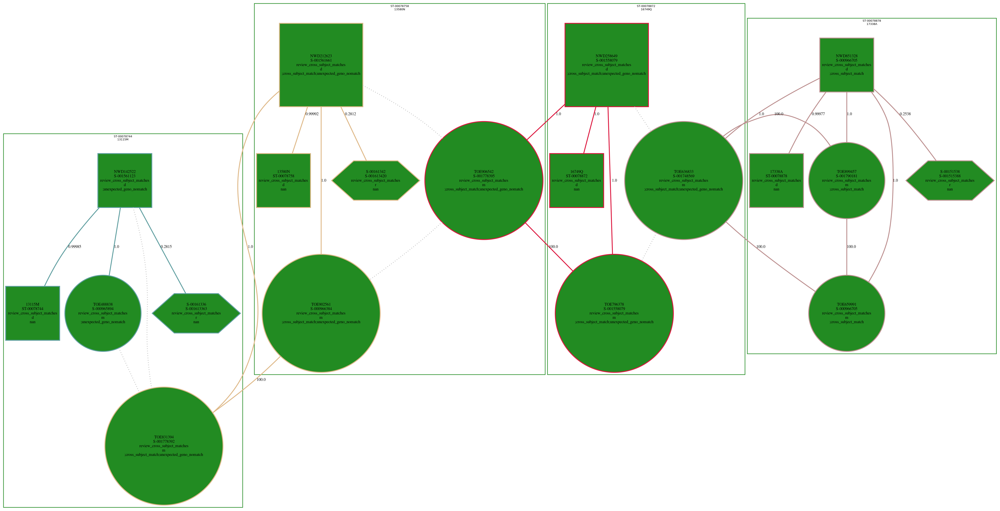

In [223]:
# 19 Nodes
GROUP_ID = 6392
display(Image(graph_generator.graph(GROUP_ID, shape_by='SampleTypeCode')))

/d/tmp/rejpz/ipykernel_4736/2528429817.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


['NWD591588', 'NWD635869', 'NWD710859', 'NWD783481', 'NWD990269', '11035E', '15173K', '17562F', '17725H', '24954N', 'TOE337739_203991530007_R05C01_358121', 'TOE486864_203866380073_R07C01_364867', 'TOE123876_203299670073_R03C01_337567', 'TOE901365_203991530014_R03C01_376789', 'TOE440111_203299670073_R02C01_337566', 'TOE394546_203991530083_R06C01_376749', 'TOE280117_203866380073_R06C01_364866', 'TOE606122_203991530083_R05C01_376748', '302538', 'S-001540083_accepted_hits.sorted.bam', 'S-001544225_accepted_hits.sorted.bam', 'S-001547327_accepted_hits.sorted.bam', 'S-001553245_accepted_hits.sorted.bam', 'S-001636891_accepted_hits.sorted.bam']


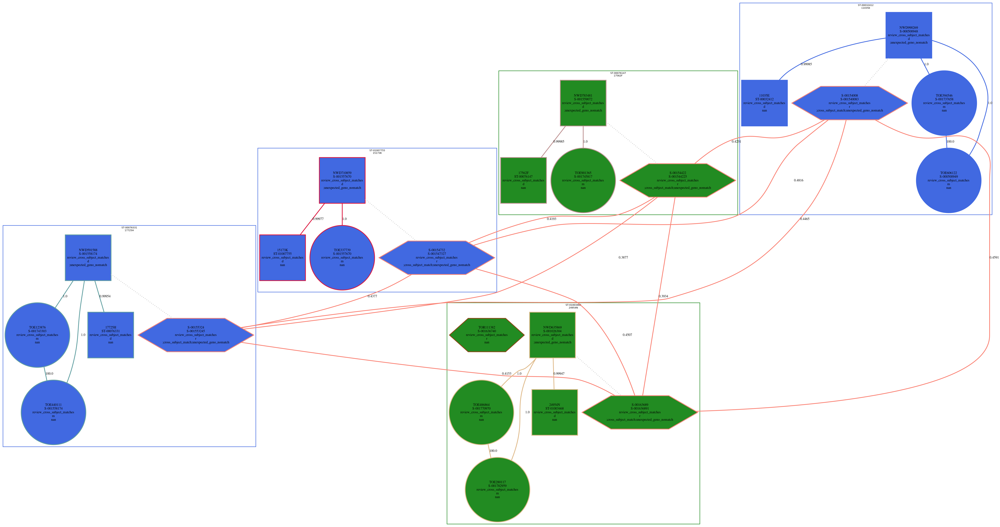

In [224]:
# 24 Nodes
GROUP_ID = 3826
display(Image(graph_generator.graph(GROUP_ID, shape_by='SampleTypeCode')))

/d/tmp/rejpz/ipykernel_4736/1977747252.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


['NWD132079', 'NWD134054', 'NWD259544', 'NWD393087', 'NWD941328', '14493X', '18944Y', '19960B', '20302C', 'TOE641173_203675240091_R06C01_345595', 'TOE102334_203808570086_R06C01_353961', 'TOE366572_203808570086_R05C01_353960', 'TOE373676_203504570016_R05C01_338395', 'TOE169950_203693970023_R04C01_353248', 'TOE630456_203504570016_R04C01_338394', 'TOE113589_203866300137_R03C01_369632', 'TOE199830_203675240091_R07C01_345596', 'TOE132059_203695310028_R07C01_353273', 'S-001630891_S19_L001_accepted_hits.sorted.bam', 'S-001630891_S19_L002_accepted_hits.sorted.bam', 'S-001630891_S19_L003_accepted_hits.sorted.bam', 'S-001630891_S19_L004_accepted_hits.sorted.bam', 'S-001633324_S3_L001_accepted_hits.sorted.bam', 'S-001633324_S3_L002_accepted_hits.sorted.bam', 'S-001633324_S3_L003_accepted_hits.sorted.bam', 'S-001633324_S3_L004_accepted_hits.sorted.bam', 'S-001633367_S22_L001_accepted_hits.sorted.bam', 'S-001633367_S22_L002_accepted_hits.sorted.bam', 'S-001633367_S22_L003_accepted_hits.sorted.bam',

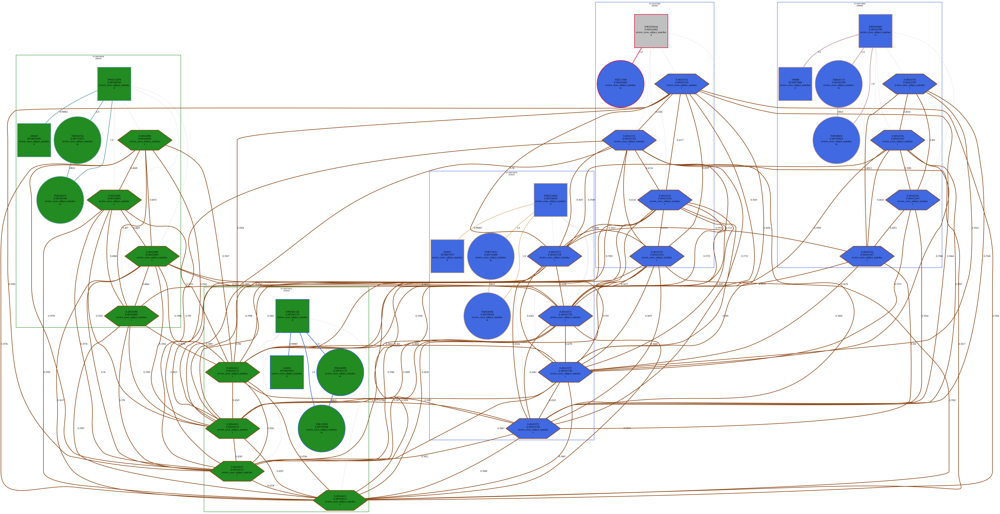

In [166]:
# 38 Nodes
GROUP_ID = 1661
display(Image(graph_generator.graph(GROUP_ID, shape_by='SampleTypeCode')))

['NWD261686' 'NWD277257' 'NWD313381' 'NWD460323' 'NWD588364' 'NWD643469'
 'NWD666193' 'NWD666779' 'NWD733404' 'NWD829838' 'NWD927152' 'NWD957025'
 '11620P' '13325X' '13678E' '15362N' '15730Q' '15792M' '16390X' '18795H'
 '19561N' '19905T' '19908Z' '22572P'
 'TOE299410_203824910042_R05C01_357855'
 'TOE268426_203866300010_R02C01_337286'
 'TOE500256_203808570051_R02C01_353746'
 'TOE103081_203715540007_R08C01_349714'
 'TOE635890_203497730200_R06C01_345727'
 'TOE621313_203833030014_R05C01_358433'
 'TOE501230_203497730241_R07C01_345770'
 'TOE434393_203829800157_R07C01_355316'
 'TOE820520_203724130050_R01C01_348880'
 'TOE529505_203675380049_R01C01_345443'
 'TOE765921_203675380049_R02C01_345444'
 'TOE895743_203829800151_R06C01_355297'
 'TOE754050_203504570024_R02C01_337775'
 'TOE366357_203829800098_R01C01_357581'
 'TOE446677_203293640103_R04C01_337615'
 'TOE222795_203829800097_R08C01_357580'
 'TOE926219_203724130050_R02C01_348881'
 'TOE738160_203715540004_R05C01_357810'
 'TOE875282_203706650017

/d/tmp/rejpz/ipykernel_4736/1977747252.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


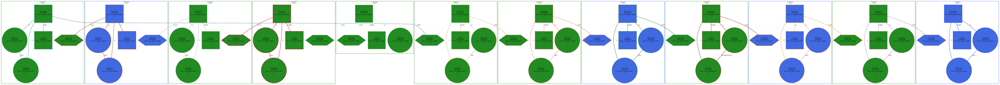

In [167]:
# 59 Nodes
GROUP_ID = 2546
print(annotated_manifest[annotated_manifest.group_id == GROUP_ID]['SampleLabel'].values)
display(Image(graph_generator.graph(GROUP_ID, shape_by='SampleTypeCode')))

In [189]:
# 101 Nodes (crashes)
GROUP_ID = 3975
display(Image(graph_generator.graph(GROUP_ID, shape_by='SampleTypeCode')))

/d/tmp/rejpz/ipykernel_4736/3210521786.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


['NWD136701', 'NWD167868', 'NWD211085', 'NWD212123', 'NWD250188', 'NWD351617', 'NWD365067', 'NWD370616', 'NWD442202', 'NWD454044', 'NWD466281', 'NWD491104', 'NWD493608', 'NWD513498', 'NWD536872', 'NWD540676', 'NWD565465', 'NWD590778', 'NWD653854', 'NWD663178', 'NWD678953', 'NWD770217', 'NWD794210', 'NWD867672', 'NWD900290', 'NWD900485', 'NWD908303', 'NWD929946', 'NWD933267', 'NWD974645', '10525Q', '11095W', '11190Q', '11517W', '12534B', '12952T', '14380K', '15039G', '15585H', '15907D', '16995F', '17004X', '18352Z', '18917V', '19534K', '19686H', '20077V', '20549K', '23968T', '25823D', 'TOE673061_203824900090_R07C01_354780', 'TOE964108_203711910064_R08C01_349395', 'TOE300481_203833040101_R04C01_358758', 'TOE742258_203808720067_R05C01_346330', 'TOE350507_203829800059_R07C01_355476', 'TOE814206_203991530029_R08C01_376812', 'TOE184709_203808720067_R04C01_346329', 'TOE589984_203711910064_R07C01_349394', 'TOE836958_203711910013_R04C01_349726', 'TOE495538_203833030004_R07C01_355351', 'TOE87999

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



AssertionError: "dot" with args ['-Tpng', '/d/tmp/rejpz/tmp2s6f76yb'] returned code: 1

In [190]:
# 145 Nodes
GROUP_ID = 6733
display(Image(graph_generator.graph(GROUP_ID, shape_by='SampleTypeCode')))

/d/tmp/rejpz/ipykernel_4736/3210521786.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


['NWD156315', 'NWD206588', 'NWD219805', 'NWD272275', 'NWD288002', 'NWD299563', 'NWD345662', 'NWD349141', 'NWD381843', 'NWD398592', 'NWD447010', 'NWD448139', 'NWD522854', 'NWD524051', 'NWD524708', 'NWD563857', 'NWD565738', 'NWD621474', 'NWD687928', 'NWD768760', 'NWD781756', 'NWD816403', 'NWD843627', 'NWD850955', 'NWD875349', 'NWD894917', 'NWD937018', 'NWD947515', 'NWD982729', 'NWD999608', '11571C', '11814C', '13301J', '13515C', '13621B', '13956G', '14160W', '14894P', '16428W', '16491D', '16651Z', '17560B', '17745N', '18278N', '18293J', '18637P', '18704E', '18708M', '18848C', '18961Y', '19031K', '19286R', '19569D', '19959Q', '20289K', '20699D', '21385L', '21525B', '21558Q', '23476Y', 'TOE617373_203867050052_R04C01_363972', 'TOE987768_203516050006_R05C01_338169', 'TOE401189_203829800084_R06C01_355658', 'TOE372197_203706650053_R02C01_353119', 'TOE999059_203808570120_R01C01_348832', 'TOE855524_203504570014_R01C01_337758', 'TOE360303_203706650053_R03C01_353120', 'TOE614163_203867050137_R02C0

----
----

# DEBUG!!!!!

In [51]:
### Code

# Run this app with `python app.py` and
# visit http://127.0.0.1:8050/ in your web browser.

import pandas as pd
from IPython.display import Image, display

import os

import matplotlib.pyplot as plt

from itertools import combinations
import math
import pydot

def set_node_label(row):
    alias = row.SampleAlias
    if len(alias) > 10:
        alias = alias[:10]
    return f'{alias}\n{row.status}'

SEX_COLOR_LOOKUP = {'M': 'royalblue', 'F': 'forestgreen'}

class GenerateGraph:
    # initialize object with manifest data and cdata
    def __init__(self, manifest_df, cdata_df):
        self.df = manifest_df
        self.dfc = cdata_df
        self.node_mappings = { 
            "ObservedGender": { "F": "circle", "M": "square", "U": "star", "nan": "star" },
            "SampleLabel":    { "Number": "square", "NWD": "hexagon", "TOE": "triangle" },
            "SampleAlias":    { "Number": "square", "NWD": "hexagon", "TOE": "triangle" },
            "SampleTypeCode": {
                "d": "square", "m": "circle", "r": "hexagon"
            },
            "dataset_id":     { "tmp0": "square", "tmp1": "diamond", "tmp2": "triangle", "tmp3": "circle" },
            "S_SAMPLEID":    { "tmp0": "square", "tmp1": "diamond", "tmp2": "triangle", "tmp3": "circle" }
        }
    
    # method to call to generate graph
    def graph(self, group_id, shape_by):
        # filtering by group_id
        query_groupid = f'group_id == {group_id}'
        df_filter_groupid = self.df.query(query_groupid)
        df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)
        
        nodes = df_filter_groupid["SampleLabel"].values
        
        ### Get the list of subject ids and set colors for subjects
        subjects = list(set(df_filter_groupid["S_SUBJECTID"].values))
        
        # create graph
        G = pydot.Dot('tmp/graph_path.png', graph_type="graph", compound='true', fontname='Verdana')
        
        ### process concordance data into edges
        nodes = list(df_filter_groupid['SampleLabel'].values)
        all_edges = list(combinations(nodes, 2))
        
        ### Annotated manifest self.df
        ### c_data self.dfc
        ### find all sub-graphs 
        BEST_COLORS = ['cadetblue', 'burlywood', 'crimson', 'rosybrown', 'royalblue', 'saddlebrown', 'salmon', 'sandybrown',
                       'seagreen','seashell','sienna', 'silver', 'skyblue', 'slateblue', 'slategray','slategrey',' snow',
                       'springgreen']
        COLOR_LOOKUP = {}
        subject_pairs = list(combinations(subjects, 2))
        
        color_index = 0
        for subject in subjects:
            COLOR_LOOKUP[(subject, subject)] = BEST_COLORS[color_index]
            color_index += 1
            if color_index >= len(BEST_COLORS): color_index = 0

        for (subject1, subject2) in subject_pairs:
            COLOR_LOOKUP[(subject1, subject2)] = BEST_COLORS[color_index]
            COLOR_LOOKUP[(subject2, subject1)] = BEST_COLORS[color_index]
            color_index += 1
            if color_index >= len(BEST_COLORS): color_index = 0
        print(f'{COLOR_LOOKUP}')
        
        for (sample1, sample2) in all_edges:
            query_string = f'ID1 == "{sample1}" and ID2 == "{sample2}"'
            
            
            subject1 = df_filter_groupid[df_filter_groupid.SampleLabel == sample1]['S_SUBJECTID'].values[0]
            subject2 = df_filter_groupid[df_filter_groupid.SampleLabel == sample2]['S_SUBJECTID'].values[0]
            
            ### to simplify, we color the edge based on the pair of joined subjects
            color = COLOR_LOOKUP[(subject1, subject2)]
            
            try:
                c_record = self.dfc.query(query_string)
                concord = c_record["Concord"].values[0]
                expected = c_record['expected'].values[0]
                attempted = c_record['attempted'].values[0]
                observed = c_record['observed'].values[0]
                # only create edge for pairs that have concord values
                if not math.isnan(concord):
                    if not expected:
                        ## color = 'darkgoldenrod2'
                        style = 'solid,setlinewidth(3)'
                    else:
                        ## color = 'black'
                        style = 'solid'
                    label = concord
                    new_edge = pydot.Edge(sample1, sample2, label=label, color=color, style=style)
                    G.add_edge(new_edge)
                elif (attempted and expected) and not observed:
                    color = 'gray'
                    style = 'dotted'
                    new_edge = pydot.Edge(sample1, sample2, color=color, style=style)
                    G.add_edge(new_edge)
                    
            except Exception as e:
                pass
        
        ### Process each sample into a node
        for (s, subject) in enumerate(subjects):

            # add nodes
            samples = df_filter_groupid[df_filter_groupid.S_SUBJECTID == subject]
            cluster = pydot.Cluster(graph_name=subject, label=f"{subject}\n{samples.iloc[0].ALIASID}", 
                                   fontsize="10", style="bold", fillcolor="white",
                                   color=SEX_COLOR_LOOKUP.get(samples.iloc[0].ExpectedGender, 'gray'))
            ## print(f'{subject}: {samples}')
            fill = s + 1
            for (s_idx, sample) in samples.iterrows():
                node_label = f'{sample.NodeLabel}'
                sample_label = sample.SampleLabel
                shape = self.node_mappings['SampleTypeCode'][sample.SampleTypeCode]
                
                c_data_query_string = f'(ID1 == "{sample_label}") or (ID2 == "{sample_label}")'
                c_records = self.dfc.query(c_data_query_string)
                c_records = c_records[c_records['Concord'].notna()]
                c_records = c_records[c_records['expected'] == 0]
                if c_records.size > 0:
                    color = 'darkgoldenrod2'
                    style = 'filled,setlinewidth(6)'
                else:
                    color = 'black' # SEX_COLOR_LOOKUP.get(sample.ObservedGender, 'gray')
                    style = 'filled,setlinewidth(2)'
                fillcolor = SEX_COLOR_LOOKUP.get(sample.ObservedGender, 'gray')
                node = pydot.Node(sample_label, label=node_label, shape=shape, style=style, color=color, fillcolor=fillcolor)
                cluster.add_node(node)

            G.add_subgraph(cluster)
        
        return G.create_png()

graph_generator = GenerateGraph(annotated_manifest, c_data)


/d/tmp/rejpz/ipykernel_4736/1815009247.py:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)


['NWD132079', 'NWD134054', 'NWD259544', 'NWD393087', 'NWD941328', '14493X', '18944Y', '19960B', '20302C', 'TOE641173_203675240091_R06C01_345595', 'TOE102334_203808570086_R06C01_353961', 'TOE366572_203808570086_R05C01_353960', 'TOE373676_203504570016_R05C01_338395', 'TOE169950_203693970023_R04C01_353248', 'TOE630456_203504570016_R04C01_338394', 'TOE113589_203866300137_R03C01_369632', 'TOE199830_203675240091_R07C01_345596', 'TOE132059_203695310028_R07C01_353273', 'S-001630891_S19_L001_accepted_hits.sorted.bam', 'S-001630891_S19_L002_accepted_hits.sorted.bam', 'S-001630891_S19_L003_accepted_hits.sorted.bam', 'S-001630891_S19_L004_accepted_hits.sorted.bam', 'S-001633324_S3_L001_accepted_hits.sorted.bam', 'S-001633324_S3_L002_accepted_hits.sorted.bam', 'S-001633324_S3_L003_accepted_hits.sorted.bam', 'S-001633324_S3_L004_accepted_hits.sorted.bam', 'S-001633367_S22_L001_accepted_hits.sorted.bam', 'S-001633367_S22_L002_accepted_hits.sorted.bam', 'S-001633367_S22_L003_accepted_hits.sorted.bam',

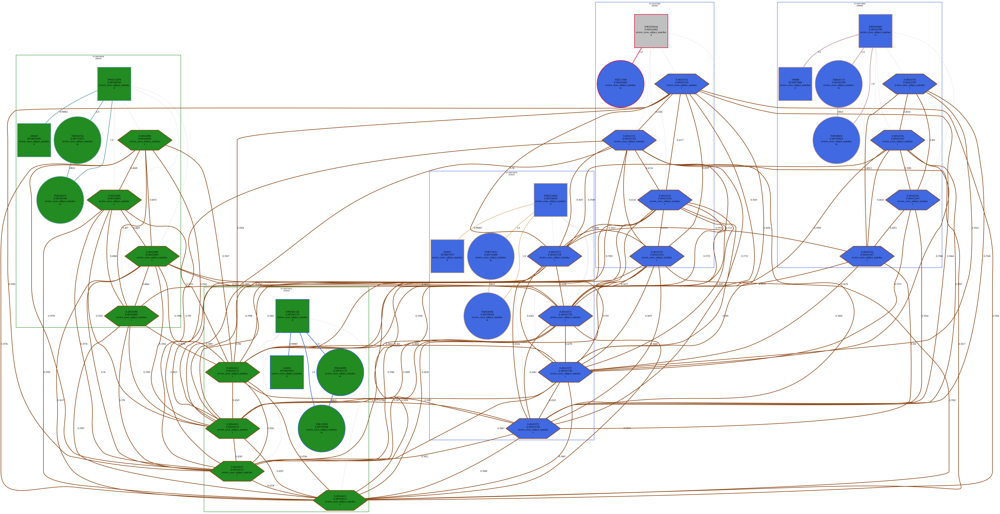

In [192]:
## group_id = annotated_manifest[annotated_manifest['SampleAlias'] == input_value].reset_index()['group_id'][0]
group_id = 1661 # 1661 shows how bad some of the rna samples really are (takes about 30 secs)
## group_id = 1495 # 1495 all samples are the same -- 2 subjects are the same!
## group_id = 1988 #8133? (254 members)
display(Image(graph_generator.graph(group_id, shape_by='SampleTypeCode')))


# Network Stuff

My idea is that there are two networks here, and I should use better data structures to represent them, so that it is 
more systematic how I am joing them together in the plots above.  Networks

* Gm: The metadata network (based on S_SUBJECTID)
* Gc: The concordance network (based on concordance_observations

In [53]:
import networkx as nx

annotated_manifest = pd.read_csv(MULTIOMICS_MANIFEST_EXTRACTED)
c_data = pd.read_csv(MULTIOMICS_CDATA_EXTRACTED)

In [54]:
SAMPLE_ALIAS = 'NWD529413'

subject_id = annotated_manifest[annotated_manifest.SampleAlias == SAMPLE_ALIAS]['S_SUBJECTID'].values[0]
sample_group = annotated_manifest[annotated_manifest.S_SUBJECTID==subject_id]

sample_group


,Unnamed: 0,SampleLabel,S_SAMPLEID_manifest,SampleAlias,SampleTypeCode,dataset_id,is_reference,S_SUBJECTID,S_SAMPLEID,S_SUBJECTID_sample,S_STUDYID,ALIASTYPE,ALIASID,ExpectedGender,ObservedGender,flags,group_id,keep_drop,status
5145,5145,NWD529413,NaN,NWD529413,d,0,0,ST-00007754,S-001560836,ST-00007754,GECOPD,Pheno Id,11528B,M,M,NaN,385,keep,pass
11731,11731,11528B,NaN,11528B,d,1,0,ST-00007754,ST-00007754,NaN,NaN,NaN,NaN,M,M,NaN,385,keep,pass
22724,22724,TOE506462_203867050099_R01C01_364732,S-001560836,TOE506462,m,2,0,ST-00007754,S-001560836,ST-00007754,GECOPD,Pheno Id,11528B,M,M,NaN,385,keep,pass
24020,24020,TOE855831_203867050099_R02C01_364733,S-001785566,TOE855831,m,2,0,ST-00007754,S-001785566,ST-00007754,GECOPD,Pheno Id,11528B,M,M,NaN,385,keep,pass
25748,25748,TOE729374_203867050093_R08C01_364731,S-001839605,TOE729374,m,2,0,ST-00007754,S-001839605,ST-00007754,GECOPD,Pheno Id,11528B,M,M,NaN,385,keep,pass
33520,33520,303617,S-001615491,TOR229938,r,3,0,ST-00007754,S-001615491,ST-00007754,GECOPD,Pheno Id,11528B,M,M,NaN,385,keep,pass
37413,37413,S-001615515_S13_L001_accepted_hits.sorted.bam,S-001615515,S-001615515_S13_L001_accepted_hits.sorted.bam,r,4,0,ST-00007754,S-001615515,ST-00007754,GECOPD,Pheno Id,11528B,M,M,NaN,385,keep,pass
37414,37414,S-001615515_S13_L002_accepted_hits.sorted.bam,S-001615515,S-001615515_S13_L002_accepted_hits.sorted.bam,r,4,0,ST-00007754,S-001615515,ST-00007754,GECOPD,Pheno Id,11528B,M,M,NaN,385,keep,pass
37415,37415,S-001615515_S13_L003_accepted_hits.sorted.bam,S-001615515,S-001615515_S13_L003_accepted_hits.sorted.bam,r,4,0,ST-00007754,S-001615515,ST-00007754,GECOPD,Pheno Id,11528B,M,M,NaN,385,keep,pass
37416,37416,S-001615515_S13_L004_accepted_hits.sorted.bam,S-001615515,S-001615515_S13_L004_accepted_hits.sorted.bam,r,4,0,ST-00007754,S-001615515,ST-00007754,GECOPD,Pheno Id,11528B,M,M,NaN,385,keep,pass


In [55]:
### Get 

In [56]:
all_observed_edges = c_data[c_data['observed'] == 1]
all_observed_edges

,Unnamed: 0,ID1,ID2,attempted,expected,observed,Concord
0,0,NWD162119,17084V,1,0,1,1.0000
1,1,NWD162119,TOE778016_203991470109_R03C01_376437,1,0,1,1.0000
2,2,NWD162119,S-001587772_CGCTCATT-TATAGCCT_L003_accepted_hi...,1,0,1,0.2388
3,3,17084V,NWD162119,1,0,1,1.0000
6,6,TOE778016_203991470109_R03C01_376437,NWD162119,1,0,1,1.0000
...,...,...,...,...,...,...,...
214725,214725,TOE341576_203861150143_R04C01_369689,NWD475824,1,1,1,1.0000
214726,214726,NWD828499,TOE221772_203724130012_R08C01_346053,1,1,1,1.0000
214727,214727,NWD828499,S-001637908_accepted_hits.sorted.bam,1,1,1,0.3021
214728,214728,TOE221772_203724130012_R08C01_346053,NWD828499,1,1,1,1.0000


In [57]:
Gc = nx.from_pandas_edgelist(df=all_observed_edges, source='ID1', target='ID2', edge_attr=True) ## edge_attr=True uses all remaining column
Gc.add_nodes_from(nodes_for_adding=annotated_manifest.SampleLabel.tolist())
Gc 

In [58]:
def create_subgraph(G,sub_G,start_node):
    sub_G.add_node(start_node)
    for n in G.neighbors_iter(start_node):
        if n not in sub_G.neighbors(start_node):
            sub_G.add_path([start_node,n])
            create_subgraph(G,sub_G,n)
nx.node_connected_component(Gc, SAMPLE_ALIAS)


{'11528B',
 'NWD529413',
 'S-001615515_S13_L001_accepted_hits.sorted.bam',
 'S-001615515_S13_L002_accepted_hits.sorted.bam',
 'S-001615515_S13_L003_accepted_hits.sorted.bam',
 'S-001615515_S13_L004_accepted_hits.sorted.bam',
 'TOE506462_203867050099_R01C01_364732',
 'TOE729374_203867050093_R08C01_364731',
 'TOE855831_203867050099_R02C01_364733'}

In [59]:
annotated_manifest[annotated_manifest.group_id==2546]

,Unnamed: 0,SampleLabel,S_SAMPLEID_manifest,SampleAlias,SampleTypeCode,dataset_id,is_reference,S_SUBJECTID,S_SAMPLEID,S_SUBJECTID_sample,S_STUDYID,ALIASTYPE,ALIASID,ExpectedGender,ObservedGender,flags,group_id,keep_drop,status
1966,1966,NWD261686,NaN,NWD261686,d,0,0,ST-00074593,S-001560755,ST-00074593,GECOPD,Pheno Id,19561N,F,F,;cross_subject_match;unexpected_geno_nomatch,2546,drop,review_cross_subject_matches
2146,2146,NWD277257,NaN,NWD277257,d,0,0,ST-01007280,S-001559045,ST-01007280,GECOPD,Pheno Id,19905T,F,F,;cross_subject_match;unexpected_geno_nomatch,2546,drop,review_cross_subject_matches
2578,2578,NWD313381,NaN,NWD313381,d,0,0,ST-00078654,S-001561408,ST-00078654,GECOPD,Pheno Id,15362N,F,F,;cross_subject_match;unexpected_geno_nomatch,2546,drop,review_cross_subject_matches
4310,4310,NWD460323,NaN,NWD460323,d,0,0,ST-00034432,S-000545540,ST-00034432,GECOPD,Pheno Id,15730Q,F,F,;cross_subject_match;unexpected_geno_nomatch,2546,drop,review_cross_subject_matches
5845,5845,NWD588364,NaN,NWD588364,d,0,0,ST-00008118,S-001557483,ST-00008118,GECOPD,Pheno Id,13325X,M,M,;unexpected_geno_nomatch,2546,drop,review_cross_subject_matches
6521,6521,NWD643469,NaN,NWD643469,d,0,0,ST-00075026,S-001628021,ST-00075026,GECOPD,Pheno Id,16390X,F,F,;cross_subject_match;unexpected_geno_nomatch,2546,drop,review_cross_subject_matches
6781,6781,NWD666193,NaN,NWD666193,d,0,0,ST-00031235,S-000550680,ST-00031235,GECOPD,Pheno Id,15792M,F,F,;cross_subject_match;unexpected_geno_nomatch,2546,drop,review_cross_subject_matches
6789,6789,NWD666779,NaN,NWD666779,d,0,0,ST-00075284,S-001556769,ST-00075284,GECOPD,Pheno Id,11620P,M,M,;cross_subject_match;unexpected_geno_nomatch,2546,drop,review_cross_subject_matches
7582,7582,NWD733404,NaN,NWD733404,d,0,0,ST-00075059,S-001557186,ST-00075059,GECOPD,Pheno Id,13678E,M,M,;cross_subject_match;unexpected_geno_nomatch,2546,drop,review_cross_subject_matches
8749,8749,NWD829838,NaN,NWD829838,d,0,0,ST-00074860,S-001151792,ST-00074860,GECOPD,Pheno Id,18795H,F,F,;cross_subject_match,2546,drop,review_cross_subject_matches


In [60]:
nx.node_connected_component(Gc, 'NWD261686')
# c

{'19561N',
 'NWD261686',
 'S-001569075_GAATTCGT-TATAGCCT_L001_accepted_hits.sorted.bam',
 'TOE621313_203833030014_R05C01_358433',
 'TOE835696_203833040011_R04C01_358398'}

In [61]:
list(nx.all_neighbors(Gc, 'NWD261686'))


['19561N',
 'TOE621313_203833030014_R05C01_358433',
 'TOE835696_203833040011_R04C01_358398',
 'S-001569075_GAATTCGT-TATAGCCT_L001_accepted_hits.sorted.bam']

In [62]:
edges = observed_edges[observed_edges.ID1 == 'NWD529413']
edges

NameError: name 'observed_edges' is not defined

In [ ]:
# nx.draw(G)

# G.adj

# nx.degree_centrality(Gc)

#for chain in (nx.chain_decomposition(Gc)):
#    print(chain)

# https://networkx.org/documentation/stable/reference/generated/networkx.classes.function.degree.html#networkx.classes.function.degree
# nx.degree(Gc)

In [ ]:
plt.hist(nx.degree_histogram(Gc))

In [ ]:
nx.density(Gc)

In [ ]:
nx.degree(Gc.subgraph('NWD529413'))

In [ ]:
nx.info(Gc)

In [ ]:
observed_edges = c_data[(c_data['observed'] == 1) & (c_data.ID1 == SAMPLE_ALIAS)]
observed_edges

Gc = nx.from_pandas_edgelist(df=observed_edges, source='ID1', target='ID2', edge_attr=True) ## edge_attr=True uses all remaining columns
Gc.add_nodes_from(nodes_for_adding=annotated_manifest.SampleLabel.tolist())



# What if the subjects are also nodes?

In [20]:
### Code

# Run this app with `python app.py` and
# visit http://127.0.0.1:8050/ in your web browser.

import pandas as pd
from IPython.display import Image, display

import os

import matplotlib.pyplot as plt

from itertools import combinations
import math
import pydot

import networkx as nx

def set_node_label(row):
    alias = row.SampleAlias
    if len(alias) > 10:
        alias = alias[:10]
    return f'{alias}\n{row.S_SAMPLEID}\n{row.SampleTypeCode}'

SEX_COLOR_LOOKUP = {'M': 'royalblue', 'F': 'forestgreen'}

class GenerateGraph:
    # initialize object with manifest data and cdata
    def __init__(self, manifest_df, cdata_df):
        self.df = manifest_df
        self.dfc = cdata_df
        self.node_mappings = { 
            "ObservedGender": { "F": "circle", "M": "square", "U": "star", "nan": "star" },
            "SampleLabel":    { "Number": "square", "NWD": "hexagon", "TOE": "triangle" },
            "SampleAlias":    { "Number": "square", "NWD": "hexagon", "TOE": "triangle" },
            "SampleTypeCode": {
                "d": "square", "m": "circle", "r": "hexagon"
            },
            "dataset_id":     { "tmp0": "square", "tmp1": "diamond", "tmp2": "triangle", "tmp3": "circle" },
            "S_SAMPLEID":    { "tmp0": "square", "tmp1": "diamond", "tmp2": "triangle", "tmp3": "circle" }
        }
    
    # method to call to generate graph
    def graph(self, group_id, shape_by):
        # filtering by group_id
        query_groupid = f'group_id == {group_id}'
        df_filter_groupid = self.df.query(query_groupid)
        df_filter_groupid['NodeLabel'] = df_filter_groupid.apply(set_node_label, axis=1)
        
        ### Get the list of subject ids and set colors for subjects
        df_filter_groupid['S_SUBJECTID'].fillna(df_filter_groupid.SampleLabel, inplace=True)
        subjects = list(set(df_filter_groupid["S_SUBJECTID"].values))
        print(f'Extracted {len(subjects)} subjects for group_id={group_id}: {subjects}')
        
        # create graph
        G = pydot.Dot('tmp/graph_path.png', graph_type="graph", compound='true', fontname='Verdana')
        
        ## nx.bfs_edges(G, source[, reverse, depth_limit, …])
        
        ### process concordance data into edges
        nodes = list(df_filter_groupid['SampleLabel'].values)
        print(nodes)
        
        ### Annotated manifest self.df
        ### c_data self.dfc
        ### find all sub-graphs 
        BEST_COLORS = ['cadetblue', 'burlywood', 'crimson', 'rosybrown', 'royalblue', 'saddlebrown', 'salmon', 'sandybrown',
                       'seagreen','seashell','sienna', 'silver', 'skyblue', 'slateblue', 'slategray','slategrey',' snow',
                       'springgreen', 'goldenrod2']        
        seen = set()
        relevant_edges = self.dfc[(self.dfc.ID1.isin(nodes)) & (self.dfc.observed == 1)]
        Gc = nx.from_pandas_edgelist(df=relevant_edges, source='ID1', target='ID2', edge_attr=True)
        groups = []
        for node_label in nodes:
            if node_label in seen: continue
            if node_label not in Gc:
                groups.append([node_label,])
                seen.add(node_label)
                continue
            #print('BFS')
            #print(list(nx.bfs_tree(Gc, node_label)))
            #print('short')
            #print(nx.shortest_path(Gc, node_label).keys())
            connected = set(nx.bfs_tree(Gc, node_label))
            seen.update(connected)
            groups.append(connected)
        # print(f'{groups}')

        COLOR_LOOKUP = {}
        color_index = 0
        GROUP_LOOKUP = {}
        for g, group in enumerate(groups):
            for sample in group:
                GROUP_LOOKUP[sample] = g
                ## print(f'{sample}: {color_index}')
                COLOR_LOOKUP[sample] = BEST_COLORS[color_index]
            color_index += 1
            if color_index >= len(BEST_COLORS):
                color_index = 0
                
        subject_pairs = list(combinations(subjects, 2))
        
        #color_index = 0
        #for subject in subjects:
        #    COLOR_LOOKUP[(subject, subject)] = BEST_COLORS[color_index]
        #    color_index += 1
        #    if color_index >= len(BEST_COLORS): color_index = 0

        #for (subject1, subject2) in subject_pairs:
        #    COLOR_LOOKUP[(subject1, subject2)] = BEST_COLORS[color_index]
        #    COLOR_LOOKUP[(subject2, subject1)] = BEST_COLORS[color_index]
        #    color_index += 1
        #    if color_index >= len(BEST_COLORS): color_index = 0
        # print(f'{COLOR_LOOKUP}')
       
        all_edges = list(combinations(nodes, 2))
        for (sample1, sample2) in all_edges:
            
            subject1 = df_filter_groupid[df_filter_groupid.SampleLabel == sample1]['S_SUBJECTID'].values[0]
            subject2 = df_filter_groupid[df_filter_groupid.SampleLabel == sample2]['S_SUBJECTID'].values[0]
            
            ### to simplify, we color the edge based on the pair of joined subjects
            ## color = COLOR_LOOKUP[(subject1, subject2)]
            
            try:
                query_string = f'ID1 == "{sample1}" and ID2 == "{sample2}"'
                c_record = self.dfc.query(query_string)
                concord = c_record["Concord"].values[0]
                expected = c_record['expected'].values[0]
                attempted = c_record['attempted'].values[0]
                observed = c_record['observed'].values[0]
                # only create edge for pairs that have concord values
                if not math.isnan(concord):
                    color = COLOR_LOOKUP[sample1]
                    style = 'solid,setlinewidth(3)'
                    #if not expected:
                    #    ## color = 'darkgoldenrod2'
                    #    style = 'solid,setlinewidth(3)'
                    #else:
                    #    ## color = 'black'
                    #    style = 'solid'
                    label = concord
                    new_edge = pydot.Edge(sample1, sample2, label=label, color=color, style=style)
                    G.add_edge(new_edge)
                elif (attempted and expected) and not observed:
                    color = 'gray'
                    style = 'dotted,setlinewidth(3)'
                    new_edge = pydot.Edge(sample1, sample2, color=color, style=style)
                    G.add_edge(new_edge)
                    
            except Exception as e:
                pass
        
        ### Process each sample into a node
        for (s, subject) in enumerate(subjects):

            # add nodes
            samples = df_filter_groupid[df_filter_groupid.S_SUBJECTID == subject]
            cluster = pydot.Cluster(graph_name=subject, label=f"{subject}\n{samples.iloc[0].ALIASID}", 
                                   fontsize="10", style="bold", fillcolor="white",
                                   color=SEX_COLOR_LOOKUP.get(samples.iloc[0].ExpectedGender, 'gray'))
            ## print(f'{subject}: {samples}')
            fill = s + 1
            #node = pydot.Node(subject, label=subject, shape='tripleoctagon')
            #cluster.add_node(node)
            for (s_idx, sample) in samples.iterrows():
                node_label = f'{sample.NodeLabel}'
                sample_label = sample.SampleLabel
                shape = self.node_mappings['SampleTypeCode'][sample.SampleTypeCode]
                
                #new_edge = pydot.Edge(sample_label, subject)
                #G.add_edge(new_edge)
                
                #c_data_query_string = f'(ID1 == "{sample_label}") or (ID2 == "{sample_label}")'
                #c_records = self.dfc.query(c_data_query_string)
                #c_records = c_records[c_records['Concord'].notna()]
                #c_records = c_records[c_records['expected'] == 0]
                color = COLOR_LOOKUP[sample_label]
                style = 'filled,setlinewidth(3)'
                #if c_records.size > 0:
                #    #color = 'darkgoldenrod2'
                #    style = 'filled,setlinewidth(6)'
                #else:
                #    #color = 'black' # SEX_COLOR_LOOKUP.get(sample.ObservedGender, 'gray')
                #    style = 'filled,setlinewidth(2)'
                fillcolor = SEX_COLOR_LOOKUP.get(sample.ObservedGender, 'gray')
                node = pydot.Node(sample_label, label=node_label, shape=shape, style=style, color=color, fillcolor=fillcolor)
                cluster.add_node(node)

            G.add_subgraph(cluster)
        
        return G.create_png()

graph_generator = GenerateGraph(annotated_manifest, c_data)


In [21]:
### Code

import pandas as pd
from IPython.display import Image, display

import os

import matplotlib.pyplot as plt

from itertools import combinations
import math
import pydot

import networkx as nx

def set_node_label(row):
    alias = row.SampleAlias
    if len(alias) > 10:
        alias = alias[:10]
    return f''

SEX_COLOR_LOOKUP = {'M': 'royalblue', 'F': 'forestgreen'}

class GenerateGraphThumbnail:
    # initialize object with manifest data and cdata
    def __init__(self, manifest_df, cdata_df):
        self.df = manifest_df
        self.dfc = cdata_df
        self.node_mappings = { 
            "ObservedGender": { "F": "circle", "M": "square", "U": "star", "nan": "star" },
            "SampleLabel":    { "Number": "square", "NWD": "hexagon", "TOE": "triangle" },
            "SampleAlias":    { "Number": "square", "NWD": "hexagon", "TOE": "triangle" },
            "SampleTypeCode": {
                "d": "square", "m": "circle", "r": "hexagon"
            },
            "dataset_id":     { 0:"square", 1:"trapezium", 2: "circle", 3:"hexagon", 4: "hexagon"},
            "S_SAMPLEID":    { "tmp0": "square", "tmp1": "diamond", "tmp2": "triangle", "tmp3": "circle" }
        }
    
    # method to call to generate graph
    def graph(self, group_id, shape_by):
        # filtering by group_id
        query_groupid = f'group_id == {group_id}'
        df_filter_groupid = self.df.query(query_groupid)
        # df_filter_groupid['NodeLabel'] = '' #df_filter_groupid.apply(set_node_label, axis=1)
        
        ### Get the list of subject ids and set colors for subjects
        df_filter_groupid['S_SUBJECTID'].fillna(df_filter_groupid.SampleLabel, inplace=True)
        subjects = list(set(df_filter_groupid["S_SUBJECTID"].values))
        ## print(f'Extracted {len(subjects)} subjects for group_id={group_id}: {subjects}')
        
        # create graph
        G = pydot.Dot('tmp/graph_path.png', graph_type="graph", compound='true', fontname='Verdana')
        
        ## nx.bfs_edges(G, source[, reverse, depth_limit, …])
        
        ### process concordance data into edges
        nodes = list(df_filter_groupid['SampleLabel'].values)
        # print(nodes)
         
        ### Annotated manifest self.df
        ### c_data self.dfc
        ### find all sub-graphs 
        BEST_COLORS = ['cadetblue', 'burlywood', 'crimson', 'rosybrown', 'royalblue', 'saddlebrown', 'salmon', 'sandybrown',
                       'seagreen','seashell','sienna', 'silver', 'skyblue', 'slateblue', 'slategray','slategrey',' snow',
                       'springgreen', 'goldenrod2']        
        seen = set()
        relevant_edges = self.dfc[(self.dfc.ID1.isin(nodes)) & (self.dfc.observed == 1)]
        Gc = nx.from_pandas_edgelist(df=relevant_edges, source='ID1', target='ID2', edge_attr=True)
        groups = []
        for node_label in nodes:
            if node_label in seen: continue
            if node_label not in Gc:
                groups.append([node_label,])
                seen.add(node_label)
                continue
            connected = set(nx.bfs_tree(Gc, node_label))
            seen.update(connected)
            groups.append(connected)
        # print(f'{groups}')

        COLOR_LOOKUP = {}
        color_index = 0
        GROUP_LOOKUP = {}
        for g, group in enumerate(groups):
            for sample in group:
                GROUP_LOOKUP[sample] = g
                ## print(f'{sample}: {color_index}')
                COLOR_LOOKUP[sample] = BEST_COLORS[color_index]
            color_index += 1
            if color_index >= len(BEST_COLORS):
                color_index = 0
                
        subject_pairs = list(combinations(subjects, 2))
        
        all_edges = list(combinations(nodes, 2))
        for (sample1, sample2) in all_edges:
            
            subject1 = df_filter_groupid[df_filter_groupid.SampleLabel == sample1]['S_SUBJECTID'].values[0]
            subject2 = df_filter_groupid[df_filter_groupid.SampleLabel == sample2]['S_SUBJECTID'].values[0]
            
            ### to simplify, we color the edge based on the pair of joined subjects
            ## color = COLOR_LOOKUP[(subject1, subject2)]
            
            try:
                query_string = f'ID1 == "{sample1}" and ID2 == "{sample2}"'
                c_record = self.dfc.query(query_string)
                concord = c_record["Concord"].values[0]
                expected = c_record['expected'].values[0]
                attempted = c_record['attempted'].values[0]
                observed = c_record['observed'].values[0]
                # only create edge for pairs that have concord values
                if not math.isnan(concord):
                    color = COLOR_LOOKUP[sample1]
                    style = 'solid,setlinewidth(1)'
                    label = concord
                    new_edge = pydot.Edge(sample1, sample2, label='', color=color, style=style)
                    G.add_edge(new_edge)
                elif (attempted and expected) and not observed:
                    color = 'gray'
                    style = 'dotted,setlinewidth(1)'
                    new_edge = pydot.Edge(sample1, sample2, color=color, style=style)
                    G.add_edge(new_edge)
                    
            except Exception as e:
                pass
        
        ### Process each sample into a node
        for (s, subject) in enumerate(subjects):

            # add nodes
            samples = df_filter_groupid[df_filter_groupid.S_SUBJECTID == subject]
            cluster = pydot.Cluster(graph_name=subject, label=f"{subject}\n{samples.iloc[0].ALIASID}", 
                                   fontsize="10", style="bold", fillcolor="white",
                                   color=SEX_COLOR_LOOKUP.get(samples.iloc[0].ExpectedGender, 'gray'))
            ## print(f'{subject}: {samples}')
            fill = s + 1
            for (s_idx, sample) in samples.iterrows():
                node_label = ''
                sample_label = sample.SampleLabel
                shape = self.node_mappings['dataset_id'][sample.dataset_id]
                
                color = COLOR_LOOKUP[sample_label]
                style = 'filled,setlinewidth(1)'
                fillcolor = SEX_COLOR_LOOKUP.get(sample.ObservedGender, 'gray')
                node = pydot.Node(sample_label, label=node_label, shape=shape, style=style, color=color, fillcolor=fillcolor)
                cluster.add_node(node)

            G.add_subgraph(cluster)
        
        return G.create_png()

graph_thumbnail_generator = GenerateGraphThumbnail(annotated_manifest, c_data)


/udd/rejpz/.conda/envs/cdnm-jupyter-python-3.7.6/lib/python3.9/site-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


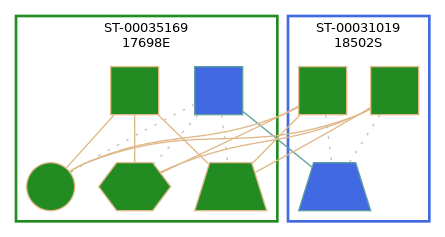

In [22]:
# 19 Nodes

# NWD284784
# NWD593699
# TOR860149

GROUP_ID = annotated_manifest[annotated_manifest.SampleAlias == 'NWD284784'].group_id.values[0]
display(Image(graph_thumbnail_generator.graph(GROUP_ID, shape_by='dataset_id')))